# 3D Multi-class Segmentation with UNETR  (Muscle, Fat (subcut and internal), psoas, Cavity,BGD)

## Setup environment

In [1]:
!pip install -q "monai-weekly[nibabel, tqdm, einops]"
!python -c "import matplotlib" || pip install -q matplotlib
%matplotlib inline

In [2]:
import os
import shutil
import tempfile

import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

from monai.losses import DiceCELoss
from monai.inferers import sliding_window_inference
from monai.transforms import (
    AsDiscrete,
    EnsureChannelFirstd,
    AddChanneld,
    Compose,
    CropForegroundd,
    LoadImaged,
    Orientationd,
    RandFlipd,
    RandCropByPosNegLabeld,
    RandShiftIntensityd,
    SaveImaged,
    ScaleIntensityRanged,
    Spacingd,
    RandRotate90d,
    ToTensord,
)

from monai.config import print_config
from monai.metrics import DiceMetric
from monai.networks.nets import UNETR

from monai.data import (
    DataLoader,
    CacheDataset,
    load_decathlon_datalist,
    decollate_batch,
)


import torch

print_config()

MONAI version: 0.10.dev2231
Numpy version: 1.23.1
Pytorch version: 1.12.0+cu102
MONAI flags: HAS_EXT = False, USE_COMPILED = False, USE_META_DICT = False
MONAI rev id: 8236821c099e5997f7ad0410c5374e4472f4ed14
MONAI __file__: /home/adminbthomas/miniconda3/envs/PT02/lib/python3.9/site-packages/monai/__init__.py

Optional dependencies:
Pytorch Ignite version: 0.4.9
Nibabel version: 4.0.1
scikit-image version: 0.19.3
Pillow version: 9.2.0
Tensorboard version: 2.9.1
gdown version: 4.5.1
TorchVision version: 0.13.0+cu102
tqdm version: 4.64.0
lmdb version: 1.3.0
psutil version: 5.9.1
pandas version: 1.4.3
einops version: 0.4.1
transformers version: 4.20.1
mlflow version: 1.27.0
pynrrd version: NOT INSTALLED or UNKNOWN VERSION.

For details about installing the optional dependencies, please visit:
    https://docs.monai.io/en/latest/installation.html#installing-the-recommended-dependencies



## Setup data directory


In [3]:
# directory = os.environ.get("MONAI_DATA_DIRECTORY")
root_dir = "/home/adminbthomas/Downloads/ensemble/unetr"# root_dir = tempfile.mkdtemp() if directory is None else directory
print(root_dir)

/home/adminbthomas/Downloads/ensemble/unetr


## Setup transforms for training and validation

In [4]:
import datetime
import time

train_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"], ensure_channel_first=True),
#         AddChanneld(keys=["image", "label"]),
        Orientationd(keys=["image", "label"], axcodes="RAS"),
        Spacingd(
            keys=["image", "label"],
            pixdim=(1.5, 1.5, 4.0),
            mode=("bilinear", "nearest"),
        ),
        ScaleIntensityRanged(
            keys=["image"],
            a_min=0,
            a_max=250,
            b_min=0.0,
            b_max=1.0,
            clip=False,   # change-intermedouts 
        ),
        CropForegroundd(keys=["image", "label"], source_key="image"),
        RandCropByPosNegLabeld(
            keys=["image", "label"],
            label_key="label",
            spatial_size=(96, 96, 16),
            pos=1,
            neg=1,
            num_samples=4,
            image_key="image",
            image_threshold=0,
        ),
        RandFlipd(
            keys=["image", "label"],
            spatial_axis=[0],
            prob=0.10,
        ),
        RandFlipd(
            keys=["image", "label"],
            spatial_axis=[1],
            prob=0.10,
        ),
        RandFlipd(
            keys=["image", "label"],
            spatial_axis=[2],
            prob=0.10,
        ),
        RandRotate90d(
            keys=["image", "label"],
            prob=0.10,
            max_k=3,
        ),
        RandShiftIntensityd(
            keys=["image"],
            offsets=0.10,
            prob=0.50,
        ),
        ToTensord(keys=["image", "label"]),
#         SaveImaged(keys="image", meta_keys="image_meta_dict", output_dir="./outMR02_Jul23_Interinputs", output_postfix=datetime.datetime.now().strftime('%f'), resample=False, separate_folder=False),
#         SaveImaged(keys="label", meta_keys="label_meta_dict", output_dir="./outMR02_Jul23_Interinputs", output_postfix=datetime.datetime.now().strftime('%f'), resample=False, separate_folder=False),
    ]
)
val_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"], ensure_channel_first=True),
#         AddChanneld(keys=["image", "label"]),
        Orientationd(keys=["image", "label"], axcodes="RAS"),
        Spacingd(
            keys=["image", "label"],
            pixdim=(1.5, 1.5, 4.0),
            mode=("bilinear", "nearest"),
        ),
        ScaleIntensityRanged(
            keys=["image"], a_min=0, a_max=250, b_min=0.0, b_max=1.0, clip=False
        ),
        CropForegroundd(keys=["image", "label"], source_key="image"),
        ToTensord(keys=["image", "label"]),
    ]
)

### DATA

In [5]:
data_dir = os.path.join(root_dir,"../data/")

In [6]:
split_JSON = "dataset_MR09fold0.json"
datasets = data_dir + split_JSON
datalist = load_decathlon_datalist(datasets, True, "training")
val_files = load_decathlon_datalist(datasets, True, "validation")
train_ds = CacheDataset(
    data=datalist,
    transform=train_transforms,
    cache_num=24,
    cache_rate=1.0,
    num_workers=8,
)
train_loader = DataLoader(
    train_ds, batch_size=1, shuffle=True, num_workers=8, pin_memory=True
)
val_ds = CacheDataset(
    data=val_files, transform=val_transforms, cache_num=6, cache_rate=1.0, num_workers=4
)
val_loader = DataLoader(
    val_ds, batch_size=1, shuffle=False, num_workers=4, pin_memory=True
)

Loading dataset:   0%|                                                                                                                                                       | 0/12 [00:00<?, ?it/s]Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]
Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]
Loading dataset: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00,  8.37it/s]


## Check data shape and visualize

image shape: torch.Size([1, 250, 176, 49]), label shape: torch.Size([1, 250, 176, 49])


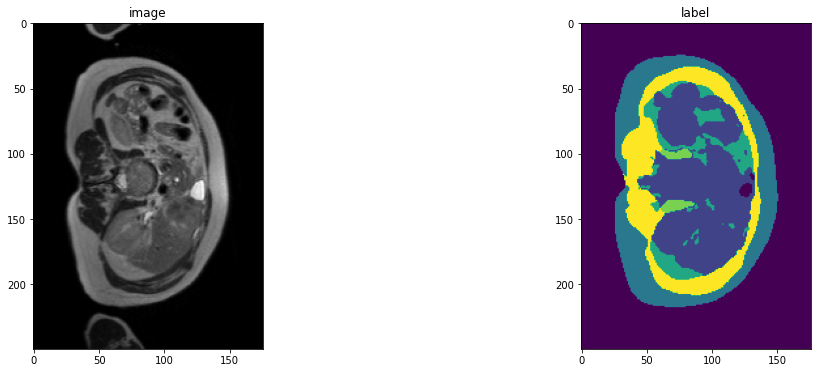

In [7]:
slice_map = {
    "A026_v1_T2W.nii.gz": 10,
    "A026_v1_T2W.nii.gz": 8,
    "A026_v1_T2W.nii.gz": 6
}
case_num = 1
img_name = os.path.split(val_ds[case_num]["image_meta_dict"]["filename_or_obj"])[1]
img = val_ds[case_num]["image"]
label = val_ds[case_num]["label"]
img_shape = img.shape
label_shape = label.shape
print(f"image shape: {img_shape}, label shape: {label_shape}")
plt.figure("image", (18, 6))
plt.subplot(1, 2, 1)
plt.title("image")
plt.imshow(img[0, :, :, slice_map[img_name]].detach().cpu(), cmap="gray")
plt.subplot(1, 2, 2)
plt.title("label")
plt.imshow(label[0, :, :, slice_map[img_name]].detach().cpu())
plt.show()

### Create Model, Loss, Optimizer


In [5]:
# os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
device = torch.device("cuda:0")

model = UNETR(
    in_channels=1,
    out_channels=6,
    img_size=(96, 96, 16),
    feature_size=16,
    hidden_size=768,
    mlp_dim=3072,
    num_heads=12,
    pos_embed="perceptron",
    norm_name="instance",
    res_block=True,
    dropout_rate=0.0,
).to(device)

loss_function = DiceCELoss(to_onehot_y=True, softmax=True)
torch.backends.cudnn.benchmark = True
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-5)

### Execute a typical PyTorch training process

In [9]:
def validation(epoch_iterator_val):
    model.eval()
    dice_vals = list()
    with torch.no_grad():
        for step, batch in enumerate(epoch_iterator_val):
            val_inputs, val_labels = (batch["image"].to(device), batch["label"].to(device))
            val_outputs = sliding_window_inference(val_inputs, (96, 96, 16), 4, model)
            val_labels_list = decollate_batch(val_labels)
            val_labels_convert = [
                post_label(val_label_tensor) for val_label_tensor in val_labels_list
            ]
            val_outputs_list = decollate_batch(val_outputs)
            val_output_convert = [
                post_pred(val_pred_tensor) for val_pred_tensor in val_outputs_list
            ]
            dice_metric(y_pred=val_output_convert, y=val_labels_convert)
            dice = dice_metric.aggregate().item()
            dice_vals.append(dice)
            epoch_iterator_val.set_description(
                "Validate (%d / %d Steps) (dice=%2.5f)" % (global_step, 10.0, dice)
            )
        dice_metric.reset()
    mean_dice_val = np.mean(dice_vals)
    return mean_dice_val


def train(global_step, train_loader, dice_val_best, global_step_best):
    model.train()
    epoch_loss = 0
    step = 0
    epoch_iterator = tqdm(
        train_loader, desc="Training (X / X Steps) (loss=X.X)", dynamic_ncols=True
    )
    for step, batch in enumerate(epoch_iterator):
        step += 1
        x, y = (batch["image"].to(device), batch["label"].to(device))
#         print(x.shape)
#         print(y.shape)
#         plt.figure("image", (18, 6))
#         plt.subplot(1, 2, 1)
#         plt.title("image")
#         plt.imshow(x[3,0,:,:,4].detach().cpu(), cmap="gray")
#         plt.subplot(1, 2, 2)
#         plt.title("label")
#         plt.imshow(y[3,0,:,:,4].detach().cpu())
#         plt.show()
        logit_map = model(x)
        loss = loss_function(logit_map, y)
        loss.backward()
        epoch_loss += loss.item()
        optimizer.step()
        optimizer.zero_grad()
        epoch_iterator.set_description(
            "Training (%d / %d Steps) (loss=%2.5f)" % (global_step, max_iterations, loss)
        )
        if (
            global_step % eval_num == 0 and global_step != 0
        ) or global_step == max_iterations:
            epoch_iterator_val = tqdm(
                val_loader, desc="Validate (X / X Steps) (dice=X.X)", dynamic_ncols=True
            )
            dice_val = validation(epoch_iterator_val)
            epoch_loss /= step
            epoch_loss_values.append(epoch_loss)
            metric_values.append(dice_val)
            if dice_val > dice_val_best:
                dice_val_best = dice_val
                global_step_best = global_step
                torch.save(
                    model.state_dict(), os.path.join(root_dir, "TestMR09_unetrensemble_fold0.pth")
                )
                print(
                    "Model Was Saved ! Current Best Avg. Dice: {} Current Avg. Dice: {}".format(
                        dice_val_best, dice_val
                    )
                )
            else:
                print(
                    "Model Was Not Saved ! Current Best Avg. Dice: {} Current Avg. Dice: {}".format(
                        dice_val_best, dice_val
                    )
                )
        global_step += 1
        
    return global_step, dice_val_best, global_step_best


max_iterations = 70000
eval_num = 250
post_label = AsDiscrete(to_onehot=6)
post_pred = AsDiscrete(argmax=True, to_onehot=6)
dice_metric = DiceMetric(include_background=True, reduction="mean", get_not_nans=False)
global_step = 0
dice_val_best = 0.0
global_step_best = 0
epoch_loss_values = []
metric_values = []
while global_step < max_iterations:
    global_step, dice_val_best, global_step_best = train(
        global_step, train_loader, dice_val_best, global_step_best
    )
#     print('I am waiting....')
#     time.sleep(1)
model.load_state_dict(torch.load(os.path.join(root_dir, "TestMR09_unetrensemble_fold0.pth")))

Training (251 / 70000 Steps) (loss=1.76423): 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.17it/s]

Model Was Saved ! Current Best Avg. Dice: 0.4194145103295644 Current Avg. Dice: 0.4194145103295644


Training (501 / 70000 Steps) (loss=1.64767):  83%|███████████████████████████████████████████████████████████████████████████████████████████████                   | 10/12 [00:03<00:00,  2.07it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6265694697697958 Current Avg. Dice: 0.6265694697697958


Training (751 / 70000 Steps) (loss=1.59248):  67%|████████████████████████████████████████████████████████████████████████████▋                                      | 8/12 [00:03<00:02,  1.96it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6711675326029459 Current Avg. Dice: 0.6711675326029459


Training (1001 / 70000 Steps) (loss=0.99073):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:03<00:03,  1.75it/s]

Model Was Saved ! Current Best Avg. Dice: 0.690283199151357 Current Avg. Dice: 0.690283199151357


Training (1251 / 70000 Steps) (loss=1.18792):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:05,  1.55it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7028326988220215 Current Avg. Dice: 0.7028326988220215


Training (1501 / 70000 Steps) (loss=1.32010):  17%|███████████████████                                                                                               | 2/12 [00:02<00:10,  1.06s/it]

Model Was Saved ! Current Best Avg. Dice: 0.7144559025764465 Current Avg. Dice: 0.7144559025764465


Training (1751 / 70000 Steps) (loss=1.31989): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.10it/s]

Model Was Saved ! Current Best Avg. Dice: 0.724691907564799 Current Avg. Dice: 0.724691907564799


Training (2001 / 70000 Steps) (loss=0.80676):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:00,  2.68it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.724691907564799 Current Avg. Dice: 0.7205655177434286


Training (2251 / 70000 Steps) (loss=0.96173):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:03<00:02,  1.90it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7284533977508545 Current Avg. Dice: 0.7284533977508545


Training (2501 / 70000 Steps) (loss=0.92510):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:03<00:03,  1.84it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7340215643246969 Current Avg. Dice: 0.7340215643246969


Training (2751 / 70000 Steps) (loss=0.74115):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:04,  1.95it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7340215643246969 Current Avg. Dice: 0.717846135298411


Training (3001 / 70000 Steps) (loss=0.69142):  17%|███████████████████                                                                                               | 2/12 [00:01<00:08,  1.19it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7340215643246969 Current Avg. Dice: 0.7312677899996439


Training (3251 / 70000 Steps) (loss=0.84821): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.03it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7448412577311198 Current Avg. Dice: 0.7448412577311198


Training (3501 / 70000 Steps) (loss=0.74497):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:00,  2.73it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7448412577311198 Current Avg. Dice: 0.7202607194582621


Training (3751 / 70000 Steps) (loss=0.93951):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:03<00:02,  1.94it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7539931734402975 Current Avg. Dice: 0.7539931734402975


Training (4001 / 70000 Steps) (loss=0.77977):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:02<00:02,  2.36it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7539931734402975 Current Avg. Dice: 0.7523967425028483


Training (4251 / 70000 Steps) (loss=0.69485):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:05,  1.54it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7600429654121399 Current Avg. Dice: 0.7600429654121399


Training (4501 / 70000 Steps) (loss=0.89997):  17%|███████████████████                                                                                               | 2/12 [00:02<00:10,  1.03s/it]

Model Was Saved ! Current Best Avg. Dice: 0.8135290344556173 Current Avg. Dice: 0.8135290344556173


Training (4751 / 70000 Steps) (loss=1.50894): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.63it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8135290344556173 Current Avg. Dice: 0.7966595490773519


Training (5001 / 70000 Steps) (loss=0.74563):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:00,  2.05it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8340167999267578 Current Avg. Dice: 0.8340167999267578


Training (5251 / 70000 Steps) (loss=0.62664):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:03<00:01,  2.01it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8607128262519836 Current Avg. Dice: 0.8607128262519836


Training (5501 / 70000 Steps) (loss=0.48949):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:02<00:02,  2.28it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8607128262519836 Current Avg. Dice: 0.858084241549174


Training (5751 / 70000 Steps) (loss=0.66252):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:05,  1.52it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8664438923199972 Current Avg. Dice: 0.8664438923199972


Training (6001 / 70000 Steps) (loss=0.69021):  17%|███████████████████                                                                                               | 2/12 [00:02<00:10,  1.09s/it]

Model Was Saved ! Current Best Avg. Dice: 0.8696061372756958 Current Avg. Dice: 0.8696061372756958


Training (6251 / 70000 Steps) (loss=0.76717): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:04<00:00,  2.05it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8724343578020731 Current Avg. Dice: 0.8724343578020731


Training (6501 / 70000 Steps) (loss=0.53338):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:00,  2.08it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8727931578954061 Current Avg. Dice: 0.8727931578954061


Training (6751 / 70000 Steps) (loss=0.49169):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:03<00:02,  1.96it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8783104419708252 Current Avg. Dice: 0.8783104419708252


Training (7001 / 70000 Steps) (loss=0.73593):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:02<00:02,  2.35it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8783104419708252 Current Avg. Dice: 0.8714093168576559


Training (7251 / 70000 Steps) (loss=0.49694):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:05,  1.49it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8807432452837626 Current Avg. Dice: 0.8807432452837626


Training (7501 / 70000 Steps) (loss=0.60862):  17%|███████████████████                                                                                               | 2/12 [00:01<00:08,  1.20it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8807432452837626 Current Avg. Dice: 0.8797983725865682


Training (7751 / 70000 Steps) (loss=0.67119): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.61it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8807432452837626 Current Avg. Dice: 0.8645347754160563


Training (8001 / 70000 Steps) (loss=0.46731):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:00,  2.01it/s]

Model Was Saved ! Current Best Avg. Dice: 0.880901058514913 Current Avg. Dice: 0.880901058514913


Training (8251 / 70000 Steps) (loss=0.58359):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:02<00:01,  2.51it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.880901058514913 Current Avg. Dice: 0.8736448089281718


Training (8501 / 70000 Steps) (loss=0.42388):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:02<00:02,  2.40it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.880901058514913 Current Avg. Dice: 0.8739042282104492


Training (8751 / 70000 Steps) (loss=0.51490):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:05,  1.51it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8841496706008911 Current Avg. Dice: 0.8841496706008911


Training (9001 / 70000 Steps) (loss=0.46365):  17%|███████████████████                                                                                               | 2/12 [00:01<00:08,  1.20it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8841496706008911 Current Avg. Dice: 0.8788640896479288


Training (9251 / 70000 Steps) (loss=0.55456): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.58it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8841496706008911 Current Avg. Dice: 0.877752681573232


Training (9501 / 70000 Steps) (loss=0.54201):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:00,  2.56it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8841496706008911 Current Avg. Dice: 0.8792809446652731


Training (9751 / 70000 Steps) (loss=0.50695):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:03<00:02,  1.98it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8901275595029196 Current Avg. Dice: 0.8901275595029196


Training (10001 / 70000 Steps) (loss=0.64619):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.34it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8901275595029196 Current Avg. Dice: 0.8703334530194601


Training (10251 / 70000 Steps) (loss=0.49951):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.96it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8901275595029196 Current Avg. Dice: 0.8816551566123962


Training (10501 / 70000 Steps) (loss=0.56650):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.18it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8901275595029196 Current Avg. Dice: 0.8880167007446289


Training (10751 / 70000 Steps) (loss=0.36698): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.56it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8901275595029196 Current Avg. Dice: 0.8811682860056559


Training (11001 / 70000 Steps) (loss=0.47271):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:02<00:00,  2.72it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8901275595029196 Current Avg. Dice: 0.880013664563497


Training (11251 / 70000 Steps) (loss=0.47949):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:02,  1.95it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8913712700208029 Current Avg. Dice: 0.8913712700208029


Training (11501 / 70000 Steps) (loss=0.40877):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.33it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8913712700208029 Current Avg. Dice: 0.8818572958310446


Training (11751 / 70000 Steps) (loss=0.23182):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.98it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8913712700208029 Current Avg. Dice: 0.8767332832018534


Training (12001 / 70000 Steps) (loss=0.48868):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.12it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8913712700208029 Current Avg. Dice: 0.8713076710700989


Training (12251 / 70000 Steps) (loss=0.43832): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.66it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8913712700208029 Current Avg. Dice: 0.8802883625030518


Training (12501 / 70000 Steps) (loss=0.31971):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.09it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8953526814778646 Current Avg. Dice: 0.8953526814778646


Training (12751 / 70000 Steps) (loss=0.37125):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8953526814778646 Current Avg. Dice: 0.8880287210146586


Training (13001 / 70000 Steps) (loss=0.47503):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.36it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8953526814778646 Current Avg. Dice: 0.8862641652425131


Training (13251 / 70000 Steps) (loss=0.59114):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:03,  2.00it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8953526814778646 Current Avg. Dice: 0.8904341260592142


Training (13501 / 70000 Steps) (loss=0.53009):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.22it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8953526814778646 Current Avg. Dice: 0.8872775832811991


Training (13751 / 70000 Steps) (loss=0.44529): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.64it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8953526814778646 Current Avg. Dice: 0.8761631647745768


Training (14001 / 70000 Steps) (loss=0.53275):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.66it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8953526814778646 Current Avg. Dice: 0.8901302218437195


Training (14251 / 70000 Steps) (loss=0.61370):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.47it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8953526814778646 Current Avg. Dice: 0.8879767060279846


Training (14501 / 70000 Steps) (loss=0.42417):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.29it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8953526814778646 Current Avg. Dice: 0.8868980805079142


Training (14751 / 70000 Steps) (loss=0.43889):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.95it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8953526814778646 Current Avg. Dice: 0.879134734471639


Training (15001 / 70000 Steps) (loss=0.53599):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.16it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8953526814778646 Current Avg. Dice: 0.8921324213345846


Training (15251 / 70000 Steps) (loss=0.33069): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8953526814778646 Current Avg. Dice: 0.8865814606348673


Training (15501 / 70000 Steps) (loss=0.66540):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.57it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8953526814778646 Current Avg. Dice: 0.8753133416175842


Training (15751 / 70000 Steps) (loss=0.44334):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.51it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8953526814778646 Current Avg. Dice: 0.8867307702700297


Training (16001 / 70000 Steps) (loss=0.45248):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.29it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8953526814778646 Current Avg. Dice: 0.8936695059140524


Training (16251 / 70000 Steps) (loss=0.57437):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.94it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8953526814778646 Current Avg. Dice: 0.8911765416463217


Training (16501 / 70000 Steps) (loss=0.38622):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:07,  1.29it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8953526814778646 Current Avg. Dice: 0.8940761089324951


Training (16751 / 70000 Steps) (loss=0.54756): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.75it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8953526814778646 Current Avg. Dice: 0.8902065753936768


Training (17001 / 70000 Steps) (loss=0.36687):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.62it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8953526814778646 Current Avg. Dice: 0.8906474510828654


Training (17251 / 70000 Steps) (loss=0.78353):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:02,  1.66it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8980809847513834 Current Avg. Dice: 0.8980809847513834


Training (17501 / 70000 Steps) (loss=0.47037):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.26it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980809847513834 Current Avg. Dice: 0.8895794153213501


Training (17751 / 70000 Steps) (loss=0.21679):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.91it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980809847513834 Current Avg. Dice: 0.8966318766276041


Training (18001 / 70000 Steps) (loss=0.44048):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.22it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980809847513834 Current Avg. Dice: 0.8791761795679728


Training (18251 / 70000 Steps) (loss=0.44493): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.75it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980809847513834 Current Avg. Dice: 0.8827163775761923


Training (18501 / 70000 Steps) (loss=0.39187):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.65it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980809847513834 Current Avg. Dice: 0.8945294419924418


Training (18751 / 70000 Steps) (loss=0.41616):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.59it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980809847513834 Current Avg. Dice: 0.8961001038551331


Training (19001 / 70000 Steps) (loss=0.49855):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.35it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980809847513834 Current Avg. Dice: 0.8980615536371866


Training (19251 / 70000 Steps) (loss=0.32342):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.96it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980809847513834 Current Avg. Dice: 0.8957843581835429


Training (19501 / 70000 Steps) (loss=0.39991):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.19it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980809847513834 Current Avg. Dice: 0.8946629961331686


Training (19751 / 70000 Steps) (loss=0.42957): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:04<00:00,  1.92it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8989472190539042 Current Avg. Dice: 0.8989472190539042


Training (20001 / 70000 Steps) (loss=0.45605):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.65it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8989472190539042 Current Avg. Dice: 0.8926800688107809


Training (20251 / 70000 Steps) (loss=0.36097):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8989472190539042 Current Avg. Dice: 0.8939369718233744


Training (20501 / 70000 Steps) (loss=0.41696):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.32it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8989472190539042 Current Avg. Dice: 0.8850397070248922


Training (20751 / 70000 Steps) (loss=0.56458):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.93it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8989472190539042 Current Avg. Dice: 0.8935089508692423


Training (21001 / 70000 Steps) (loss=0.41569):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.16it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8989472190539042 Current Avg. Dice: 0.8970462083816528


Training (21251 / 70000 Steps) (loss=0.70225): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.72it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8989472190539042 Current Avg. Dice: 0.8920397361119589


Training (21501 / 70000 Steps) (loss=0.55475):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:01,  1.99it/s]

Model Was Saved ! Current Best Avg. Dice: 0.9018943905830383 Current Avg. Dice: 0.9018943905830383


Training (21751 / 70000 Steps) (loss=0.46541):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.47it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9018943905830383 Current Avg. Dice: 0.8952268759409586


Training (22001 / 70000 Steps) (loss=0.41312):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.40it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9018943905830383 Current Avg. Dice: 0.8976814150810242


Training (22251 / 70000 Steps) (loss=0.29718):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.94it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9018943905830383 Current Avg. Dice: 0.8990517258644104


Training (22501 / 70000 Steps) (loss=0.53322):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.17it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9018943905830383 Current Avg. Dice: 0.8825660943984985


Training (22751 / 70000 Steps) (loss=0.26340): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.78it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9018943905830383 Current Avg. Dice: 0.8964789311091105


Training (23001 / 70000 Steps) (loss=0.33284):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.53it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9018943905830383 Current Avg. Dice: 0.895936648050944


Training (23251 / 70000 Steps) (loss=0.64586):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.51it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9018943905830383 Current Avg. Dice: 0.8973908027013143


Training (23501 / 70000 Steps) (loss=0.36834):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.29it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9018943905830383 Current Avg. Dice: 0.896164079507192


Training (23751 / 70000 Steps) (loss=0.43368):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.87it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9018943905830383 Current Avg. Dice: 0.8931624293327332


Training (24001 / 70000 Steps) (loss=0.37141):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.20it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9018943905830383 Current Avg. Dice: 0.8973244229952494


Training (24251 / 70000 Steps) (loss=0.40240): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.67it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9018943905830383 Current Avg. Dice: 0.8947100043296814


Training (24501 / 70000 Steps) (loss=0.39861):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.68it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9018943905830383 Current Avg. Dice: 0.8937906622886658


Training (24751 / 70000 Steps) (loss=0.28404):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:02,  1.98it/s]

Model Was Saved ! Current Best Avg. Dice: 0.9051838914553324 Current Avg. Dice: 0.9051838914553324


Training (25001 / 70000 Steps) (loss=0.50459):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.32it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9051838914553324 Current Avg. Dice: 0.9009660283724467


Training (25251 / 70000 Steps) (loss=0.42300):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.92it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9051838914553324 Current Avg. Dice: 0.8954972426096598


Training (25501 / 70000 Steps) (loss=0.32922):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.17it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9051838914553324 Current Avg. Dice: 0.8970026969909668


Training (25751 / 70000 Steps) (loss=0.35528): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.55it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9051838914553324 Current Avg. Dice: 0.9033206899960836


Training (26001 / 70000 Steps) (loss=0.39393):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:02<00:00,  2.69it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9051838914553324 Current Avg. Dice: 0.8934801816940308


Training (26251 / 70000 Steps) (loss=0.33452):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9051838914553324 Current Avg. Dice: 0.8979819218317667


Training (26501 / 70000 Steps) (loss=0.39411):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:03<00:03,  1.84it/s]

Model Was Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.9065388043721517


Training (26751 / 70000 Steps) (loss=0.40440):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.95it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.898711085319519


Training (27001 / 70000 Steps) (loss=0.40392):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.24it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8935638070106506


Training (27251 / 70000 Steps) (loss=0.32164): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.59it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.9023475845654806


Training (27501 / 70000 Steps) (loss=0.60411):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:02<00:00,  2.65it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.899581770102183


Training (27751 / 70000 Steps) (loss=0.38434):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.51it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.9031075239181519


Training (28001 / 70000 Steps) (loss=0.38479):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.40it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.9016170899073283


Training (28251 / 70000 Steps) (loss=0.39687):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.90it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.89297483364741


Training (28501 / 70000 Steps) (loss=0.25500):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.9013913869857788


Training (28751 / 70000 Steps) (loss=0.65510): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.66it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.899645209312439


Training (29001 / 70000 Steps) (loss=0.53636):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.58it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.9022689263025919


Training (29251 / 70000 Steps) (loss=0.46781):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.48it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.9051583409309387


Training (29501 / 70000 Steps) (loss=0.31599):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.26it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8964959581693014


Training (29751 / 70000 Steps) (loss=0.37014):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.90it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8993982871373495


Training (30001 / 70000 Steps) (loss=0.33221):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.21it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8998825550079346


Training (30251 / 70000 Steps) (loss=0.41224): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.63it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8898287216822306


Training (30501 / 70000 Steps) (loss=0.52546):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.63it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8996906280517578


Training (30751 / 70000 Steps) (loss=0.38543):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8998390634854635


Training (31001 / 70000 Steps) (loss=0.27489):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.36it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8996859192848206


Training (31251 / 70000 Steps) (loss=0.19962):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.99it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.905576229095459


Training (31501 / 70000 Steps) (loss=0.30327):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:07,  1.27it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.9017372727394104


Training (31751 / 70000 Steps) (loss=0.37615): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.70it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.9007594585418701


Training (32001 / 70000 Steps) (loss=0.20791):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.66it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8892289598782858


Training (32251 / 70000 Steps) (loss=0.39619):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.57it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8904027938842773


Training (32501 / 70000 Steps) (loss=0.43914):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.34it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.9014271100362142


Training (32751 / 70000 Steps) (loss=0.41339):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.94it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8951519727706909


Training (33001 / 70000 Steps) (loss=0.51254):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.21it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.903726061185201


Training (33251 / 70000 Steps) (loss=0.53717): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.62it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.9020272890726725


Training (33501 / 70000 Steps) (loss=0.28072):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.67it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.900020182132721


Training (33751 / 70000 Steps) (loss=0.57817):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.46it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.9025938113530477


Training (34001 / 70000 Steps) (loss=0.47405):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.24it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8892097075780233


Training (34251 / 70000 Steps) (loss=0.31748):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.89it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8955347935358683


Training (34501 / 70000 Steps) (loss=0.46694):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.19it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8973877827326456


Training (34751 / 70000 Steps) (loss=0.25267): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.78it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.9028448661168417


Training (35001 / 70000 Steps) (loss=0.38877):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.63it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8989755113919576


Training (35251 / 70000 Steps) (loss=0.33202):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.36it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.9027524987856547


Training (35501 / 70000 Steps) (loss=0.33502):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.35it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8969230453173319


Training (35751 / 70000 Steps) (loss=0.19876):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.95it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8945141434669495


Training (36001 / 70000 Steps) (loss=0.41478):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.20it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.9065302213033041


Training (36251 / 70000 Steps) (loss=0.34591): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.67it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8994349837303162


Training (36501 / 70000 Steps) (loss=0.30408):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.9023209810256958


Training (36751 / 70000 Steps) (loss=0.50703):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.59it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.9027596910794576


Training (37001 / 70000 Steps) (loss=0.40365):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.01it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8977165222167969


Training (37251 / 70000 Steps) (loss=0.25143):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.92it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8940886855125427


Training (37501 / 70000 Steps) (loss=0.38599):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.22it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.9034302035967509


Training (37751 / 70000 Steps) (loss=0.40347): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.63it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.9009932478268942


Training (38001 / 70000 Steps) (loss=0.37552):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8975563844045004


Training (38251 / 70000 Steps) (loss=0.38391):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.56it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8901610175768534


Training (38501 / 70000 Steps) (loss=0.27884):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.42it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8984422286351522


Training (38751 / 70000 Steps) (loss=0.48739):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.93it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8984837929407755


Training (39001 / 70000 Steps) (loss=0.32770):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.21it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8971075415611267


Training (39251 / 70000 Steps) (loss=0.56552): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.68it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9065388043721517 Current Avg. Dice: 0.8918385108311971


Training (39501 / 70000 Steps) (loss=0.34351):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.05it/s]

Model Was Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9074617425600687


Training (39751 / 70000 Steps) (loss=0.46471):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.58it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9009701013565063


Training (40001 / 70000 Steps) (loss=0.30958):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.30it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.8988814949989319


Training (40251 / 70000 Steps) (loss=0.25605):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  2.00it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.8928803404172262


Training (40501 / 70000 Steps) (loss=0.43915):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.19it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.8950239022572836


Training (40751 / 70000 Steps) (loss=0.42757): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.67it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9004140098889669


Training (41001 / 70000 Steps) (loss=0.32464):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.58it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9045098622639974


Training (41251 / 70000 Steps) (loss=0.32239):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.51it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9029884735743204


Training (41501 / 70000 Steps) (loss=0.54721):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.32it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9003862738609314


Training (41751 / 70000 Steps) (loss=0.37847):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.91it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.905976672967275


Training (42001 / 70000 Steps) (loss=0.30037):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.17it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9005191326141357


Training (42251 / 70000 Steps) (loss=0.40996): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.70it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.8985891938209534


Training (42501 / 70000 Steps) (loss=0.36965):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.66it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.8995919227600098


Training (42751 / 70000 Steps) (loss=0.41095):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9021707971890768


Training (43001 / 70000 Steps) (loss=0.42668):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.37it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9017962416013082


Training (43251 / 70000 Steps) (loss=0.28845):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.95it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.8975696961085001


Training (43501 / 70000 Steps) (loss=0.42159):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9002109964688619


Training (43751 / 70000 Steps) (loss=0.33663): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.64it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.8930537899335226


Training (44001 / 70000 Steps) (loss=0.26766):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.70it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.8923618396123251


Training (44251 / 70000 Steps) (loss=0.45736):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.55it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.8970457911491394


Training (44501 / 70000 Steps) (loss=0.29177):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.34it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.904856820901235


Training (44751 / 70000 Steps) (loss=0.44633):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.91it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9011876980463663


Training (45001 / 70000 Steps) (loss=0.37638):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.17it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9009437362353007


Training (45251 / 70000 Steps) (loss=0.42424): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.63it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.8979268670082092


Training (45501 / 70000 Steps) (loss=0.40543):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.57it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.8985245625178019


Training (45751 / 70000 Steps) (loss=0.29633):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.58it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.8975780804951986


Training (46001 / 70000 Steps) (loss=0.28795):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.33it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.8956855336825053


Training (46251 / 70000 Steps) (loss=0.34265):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.85it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9027019540468851


Training (46501 / 70000 Steps) (loss=0.17702):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.20it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.8998761773109436


Training (46751 / 70000 Steps) (loss=0.34913): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.73it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9016187787055969


Training (47001 / 70000 Steps) (loss=0.31688):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.64it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.8991905053456625


Training (47251 / 70000 Steps) (loss=0.31940):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.62it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.8977960348129272


Training (47501 / 70000 Steps) (loss=0.35197):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.33it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.8918890555699667


Training (47751 / 70000 Steps) (loss=0.35666):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.89it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9006568789482117


Training (48001 / 70000 Steps) (loss=0.31162):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.18it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9038391510645548


Training (48251 / 70000 Steps) (loss=0.32413): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.65it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.898450235525767


Training (48501 / 70000 Steps) (loss=0.32780):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.72it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9013521472613016


Training (48751 / 70000 Steps) (loss=0.35529):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.40it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.901063084602356


Training (49001 / 70000 Steps) (loss=0.36604):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.28it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9028303821881613


Training (49251 / 70000 Steps) (loss=0.35211):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.94it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9058584968249003


Training (49501 / 70000 Steps) (loss=0.48156):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.19it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9029183387756348


Training (49751 / 70000 Steps) (loss=0.43534): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.67it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9023280541102091


Training (50001 / 70000 Steps) (loss=0.40714):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9020666480064392


Training (50251 / 70000 Steps) (loss=0.33792):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.12it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9024264216423035


Training (50501 / 70000 Steps) (loss=0.35375):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.30it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9050254424413046


Training (50751 / 70000 Steps) (loss=0.29773):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.93it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9027685721715292


Training (51001 / 70000 Steps) (loss=0.19646):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.16it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9025013645490011


Training (51251 / 70000 Steps) (loss=0.44848): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.69it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.8993214964866638


Training (51501 / 70000 Steps) (loss=0.25054):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.67it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.8902397553126017


Training (51751 / 70000 Steps) (loss=0.33090):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.8995758295059204


Training (52001 / 70000 Steps) (loss=0.47618):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.38it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9012705683708191


Training (52251 / 70000 Steps) (loss=0.44002):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.87it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.8997028271357218


Training (52501 / 70000 Steps) (loss=0.50157):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.24it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.906444768110911


Training (52751 / 70000 Steps) (loss=0.37004): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.65it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9066464503606161


Training (53001 / 70000 Steps) (loss=0.40613):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9053273399670919


Training (53251 / 70000 Steps) (loss=0.31587):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9000434080759684


Training (53501 / 70000 Steps) (loss=0.33524):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.24it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9021045168240865


Training (53751 / 70000 Steps) (loss=0.28888):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.93it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.899696926275889


Training (54001 / 70000 Steps) (loss=0.41302):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.16it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.8956385850906372


Training (54251 / 70000 Steps) (loss=0.42993): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.67it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.892629086971283


Training (54501 / 70000 Steps) (loss=0.40868):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.55it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9026783108711243


Training (54751 / 70000 Steps) (loss=0.20447):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.52it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.904314120610555


Training (55001 / 70000 Steps) (loss=0.26969):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.38it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9050423502922058


Training (55251 / 70000 Steps) (loss=0.32910):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.94it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.8996530572573344


Training (55501 / 70000 Steps) (loss=0.27918):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.17it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9061082601547241


Training (55751 / 70000 Steps) (loss=0.23466): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.69it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9025343060493469


Training (56001 / 70000 Steps) (loss=0.31000):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.55it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.9030466874440511


Training (56251 / 70000 Steps) (loss=0.19063):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.53it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9074617425600687 Current Avg. Dice: 0.8997330069541931


Training (56501 / 70000 Steps) (loss=0.58142):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:03<00:03,  1.78it/s]

Model Was Saved ! Current Best Avg. Dice: 0.9083584547042847 Current Avg. Dice: 0.9083584547042847


Training (56751 / 70000 Steps) (loss=0.43214):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.90it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9083584547042847 Current Avg. Dice: 0.8972757657368978


Training (57001 / 70000 Steps) (loss=0.29328):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.14it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9083584547042847 Current Avg. Dice: 0.8964945475260416


Training (57251 / 70000 Steps) (loss=0.27703): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.66it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9083584547042847 Current Avg. Dice: 0.9049204786618551


Training (57501 / 70000 Steps) (loss=0.42210):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.66it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9083584547042847 Current Avg. Dice: 0.8968949913978577


Training (57751 / 70000 Steps) (loss=0.32407):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.58it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9083584547042847 Current Avg. Dice: 0.9044261376063029


Training (58001 / 70000 Steps) (loss=0.34014):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:03<00:03,  1.79it/s]

Model Was Saved ! Current Best Avg. Dice: 0.9084671934445699 Current Avg. Dice: 0.9084671934445699


Training (58251 / 70000 Steps) (loss=0.32002):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.93it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9084671934445699 Current Avg. Dice: 0.9028017918268839


Training (58501 / 70000 Steps) (loss=0.39488):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.12it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9084671934445699 Current Avg. Dice: 0.9068231582641602


Training (58751 / 70000 Steps) (loss=0.46358): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.67it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9084671934445699 Current Avg. Dice: 0.9056818882624308


Training (59001 / 70000 Steps) (loss=0.57819):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.49it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9084671934445699 Current Avg. Dice: 0.8980914354324341


Training (59251 / 70000 Steps) (loss=0.33407):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.58it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9084671934445699 Current Avg. Dice: 0.9068740606307983


Training (59501 / 70000 Steps) (loss=0.31037):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.30it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9084671934445699 Current Avg. Dice: 0.9005202253659567


Training (59751 / 70000 Steps) (loss=0.43669):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.96it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9084671934445699 Current Avg. Dice: 0.8982493877410889


Training (60001 / 70000 Steps) (loss=0.25696):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.18it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9084671934445699 Current Avg. Dice: 0.9001136223475138


Training (60251 / 70000 Steps) (loss=0.29408): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.73it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9084671934445699 Current Avg. Dice: 0.8996272881825765


Training (60501 / 70000 Steps) (loss=0.36485):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:02<00:00,  2.72it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9084671934445699 Current Avg. Dice: 0.9012314279874166


Training (60751 / 70000 Steps) (loss=0.52840):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.52it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9084671934445699 Current Avg. Dice: 0.8998772501945496


Training (61001 / 70000 Steps) (loss=0.30832):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.35it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9084671934445699 Current Avg. Dice: 0.9006467660268148


Training (61251 / 70000 Steps) (loss=0.19469):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:03,  2.04it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9084671934445699 Current Avg. Dice: 0.9002989331881205


Training (61501 / 70000 Steps) (loss=0.32907):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.19it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9084671934445699 Current Avg. Dice: 0.8945079644521078


Training (61751 / 70000 Steps) (loss=0.25045): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.59it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9084671934445699 Current Avg. Dice: 0.9018392761548361


Training (62001 / 70000 Steps) (loss=0.38373):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.72it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9084671934445699 Current Avg. Dice: 0.8956841429074606


Training (62251 / 70000 Steps) (loss=0.22718):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.52it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9084671934445699 Current Avg. Dice: 0.9038404623667399


Training (62501 / 70000 Steps) (loss=0.45419):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.33it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9084671934445699 Current Avg. Dice: 0.9069186051686605


Training (62751 / 70000 Steps) (loss=0.29119):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.96it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9084671934445699 Current Avg. Dice: 0.8992629249890646


Training (63001 / 70000 Steps) (loss=0.26789):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.17it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9084671934445699 Current Avg. Dice: 0.9063070019086202


Training (63251 / 70000 Steps) (loss=0.18932): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.76it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9084671934445699 Current Avg. Dice: 0.9053553541501363


Training (63501 / 70000 Steps) (loss=0.32129):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:01,  1.99it/s]

Model Was Saved ! Current Best Avg. Dice: 0.908626914024353 Current Avg. Dice: 0.908626914024353


Training (63751 / 70000 Steps) (loss=0.41323):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:02,  1.98it/s]

Model Was Saved ! Current Best Avg. Dice: 0.9095428983370463 Current Avg. Dice: 0.9095428983370463


Training (64001 / 70000 Steps) (loss=0.36241):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:03<00:03,  1.85it/s]

Model Was Saved ! Current Best Avg. Dice: 0.9103218118349711 Current Avg. Dice: 0.9103218118349711


Training (64251 / 70000 Steps) (loss=0.28307):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.89it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9103218118349711 Current Avg. Dice: 0.9006102879842123


Training (64501 / 70000 Steps) (loss=0.45479):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.21it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9103218118349711 Current Avg. Dice: 0.9054108460744222


Training (64751 / 70000 Steps) (loss=0.30706): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.71it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9103218118349711 Current Avg. Dice: 0.8934190273284912


Training (65001 / 70000 Steps) (loss=0.39055):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.55it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9103218118349711 Current Avg. Dice: 0.9026668270428976


Training (65251 / 70000 Steps) (loss=0.30947):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9103218118349711 Current Avg. Dice: 0.9033487240473429


Training (65501 / 70000 Steps) (loss=0.27210):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.34it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9103218118349711 Current Avg. Dice: 0.9034740726153055


Training (65751 / 70000 Steps) (loss=0.28589):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.98it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9103218118349711 Current Avg. Dice: 0.9052656690279642


Training (66001 / 70000 Steps) (loss=0.50042):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.18it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9103218118349711 Current Avg. Dice: 0.9092255433400472


Training (66251 / 70000 Steps) (loss=0.39475): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.06it/s]

Model Was Saved ! Current Best Avg. Dice: 0.9108262658119202 Current Avg. Dice: 0.9108262658119202


Training (66501 / 70000 Steps) (loss=0.28461):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.62it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9108262658119202 Current Avg. Dice: 0.9042884906133016


Training (66751 / 70000 Steps) (loss=0.38105):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.53it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9108262658119202 Current Avg. Dice: 0.899639904499054


Training (67001 / 70000 Steps) (loss=0.28357):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.22it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9108262658119202 Current Avg. Dice: 0.9024375875790914


Training (67251 / 70000 Steps) (loss=0.36827):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.86it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9108262658119202 Current Avg. Dice: 0.9043628772099813


Training (67501 / 70000 Steps) (loss=0.35680):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.21it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9108262658119202 Current Avg. Dice: 0.9018062353134155


Training (67751 / 70000 Steps) (loss=0.24485): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.67it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9108262658119202 Current Avg. Dice: 0.896479070186615


Training (68001 / 70000 Steps) (loss=0.20601):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.63it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9108262658119202 Current Avg. Dice: 0.903974175453186


Training (68251 / 70000 Steps) (loss=0.37964):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.59it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9108262658119202 Current Avg. Dice: 0.9041882753372192


Training (68501 / 70000 Steps) (loss=0.28289):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.27it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9108262658119202 Current Avg. Dice: 0.8971042434374491


Training (68751 / 70000 Steps) (loss=0.36020):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:03,  2.02it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9108262658119202 Current Avg. Dice: 0.9002780715624491


Training (69001 / 70000 Steps) (loss=0.39729):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:07,  1.27it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9108262658119202 Current Avg. Dice: 0.9022692441940308


Training (69251 / 70000 Steps) (loss=0.25837): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.58it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9108262658119202 Current Avg. Dice: 0.8991163770357767


Training (69501 / 70000 Steps) (loss=0.22538):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.59it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9108262658119202 Current Avg. Dice: 0.9022801319758097


Training (69751 / 70000 Steps) (loss=0.24607):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.44it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9108262658119202 Current Avg. Dice: 0.8981970349947611


Training (70001 / 70000 Steps) (loss=0.47115):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.40it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9108262658119202 Current Avg. Dice: 0.8949140310287476


Training (70007 / 70000 Steps) (loss=0.27403): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  3.55it/s]


<All keys matched successfully>

In [10]:
print(
    f"train completed, best_metric: {dice_val_best:.4f} "
    f"at iteration: {global_step_best}"
)

train completed, best_metric: 0.9108 at iteration: 66250


### Plot the loss and metric

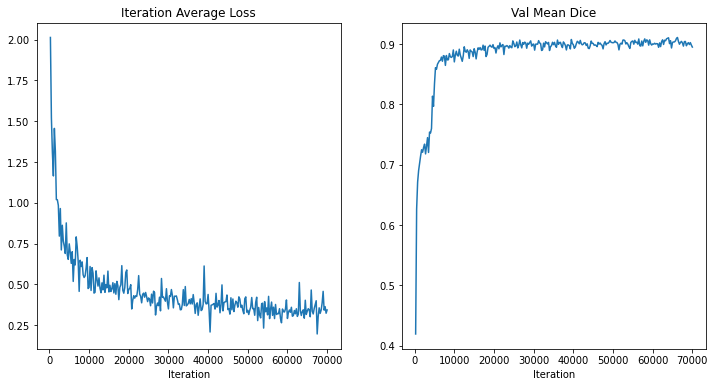

In [11]:
plt.figure("train", (12, 6))
plt.subplot(1, 2, 1)
plt.title("Iteration Average Loss")
x = [eval_num * (i + 1) for i in range(len(epoch_loss_values))]
y = epoch_loss_values
plt.xlabel("Iteration")
plt.plot(x, y)
plt.subplot(1, 2, 2)
plt.title("Val Mean Dice")
x = [eval_num * (i + 1) for i in range(len(metric_values))]
y = metric_values
plt.xlabel("Iteration")
plt.plot(x, y)
plt.show()

### Check best model output with the input image and label

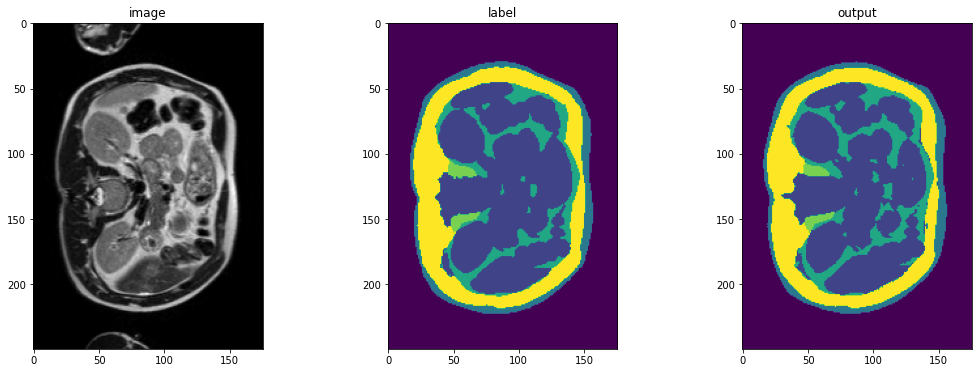

In [12]:
case_num = 0
model.load_state_dict(torch.load(os.path.join(root_dir, "TestMR09_unetrensemble_fold0.pth")))
model.eval()
with torch.no_grad():
    img_name = os.path.split(val_ds[case_num]["image_meta_dict"]["filename_or_obj"])[1]
    img = val_ds[case_num]["image"]
    label = val_ds[case_num]["label"]
    val_inputs = torch.unsqueeze(img, 1).to(device)
    val_labels = torch.unsqueeze(label, 1).to(device)
    val_outputs = sliding_window_inference(
        val_inputs, (96, 96, 16), 4, model, overlap=0.8
    )
    plt.figure("check", (18, 6))
    plt.subplot(1, 3, 1)
    plt.title("image")
    plt.imshow(val_inputs.cpu().numpy()[0, 0, :, :, 5], cmap="gray")
    plt.subplot(1, 3, 2)
    plt.title("label")
    plt.imshow(val_labels.cpu().numpy()[0, 0, :, :, 5])
    plt.subplot(1, 3, 3)
    plt.title("output")
    plt.imshow(
        torch.argmax(val_outputs, dim=1).detach().cpu()[0, :, :, 5]
    )
    plt.show()
    

In [ ]:
# val_inputs.shape

### Inference on test images

In [ ]:
# if directory is None:
#     shutil.rmtree(root_dir)

In [6]:
import glob
from monai.data import Dataset
from monai.handlers.utils import from_engine
from monai.transforms import (
    AsDiscrete,
    AsDiscreted,
    EnsureChannelFirstd,
    Compose,
    CropForegroundd,
    LoadImaged,
    Orientationd,
    RandCropByPosNegLabeld,
    SaveImaged,
    ScaleIntensityRanged,
    Spacingd,
    EnsureTyped,
    EnsureType,
    Invertd,
)

test_images = sorted(
    glob.glob(os.path.join(root_dir, "../data/imagesTs/", "*.nii.gz")))

test_data = [{"image": image} for image in test_images]


test_org_transforms = Compose(
    [
        LoadImaged(keys="image"),
        EnsureChannelFirstd(keys="image"),
        Orientationd(keys=["image"], axcodes="RAS"),
        Spacingd(keys=["image"], pixdim=(
            1.5, 1.5, 4.0), mode="bilinear"),
        ScaleIntensityRanged(
            keys=["image"], a_min=0, a_max=250,
            b_min=0.0, b_max=1.0, clip=False,
        ),
        CropForegroundd(keys=["image"], source_key="image"),
        EnsureTyped(keys="image"),
    ]
)

test_org_ds = Dataset(
    data=test_data, transform=test_org_transforms)

test_org_loader = DataLoader(test_org_ds, batch_size=1, num_workers=4)

post_transforms = Compose([
    EnsureTyped(keys="pred"),
    Invertd(
        keys="pred",
        transform=test_org_transforms,
        orig_keys="image",
        meta_keys="pred_meta_dict",
        orig_meta_keys="image_meta_dict",
        meta_key_postfix="meta_dict",
        nearest_interp=False,
        to_tensor=True,
    ),
    AsDiscreted(keys="pred", argmax=True, to_onehot=6),
    SaveImaged(keys="pred", meta_keys="pred_meta_dict", output_dir="./outMR09fold0", output_postfix="seg", resample=False, separate_folder=False),
])

Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]
Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]
Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]
Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]


2024-03-28 08:15:54,602 INFO image_writer.py:194 - writing: outMR09fold0/A002_v1_T2W_seg.nii.gz


Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]


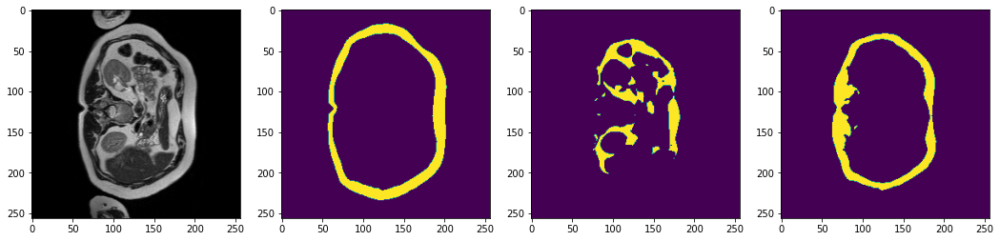

2024-03-28 08:15:56,967 INFO image_writer.py:194 - writing: outMR09fold0/A002_v2_T2W_seg.nii.gz


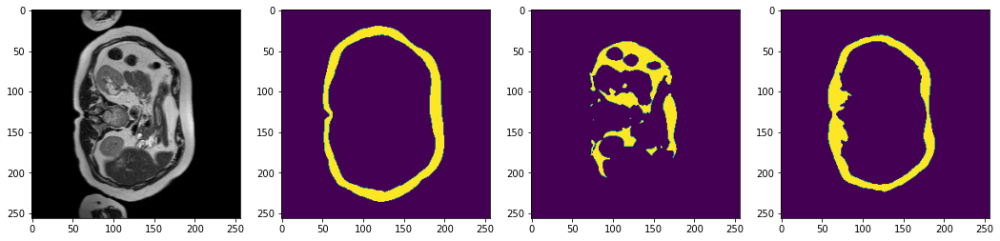

2024-03-28 08:15:59,397 INFO image_writer.py:194 - writing: outMR09fold0/A002_v3_T2W_seg.nii.gz


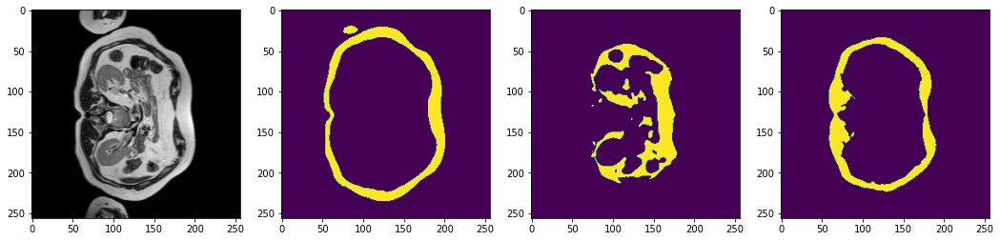

2024-03-28 08:16:01,701 INFO image_writer.py:194 - writing: outMR09fold0/A003_v1_T2W_seg.nii.gz


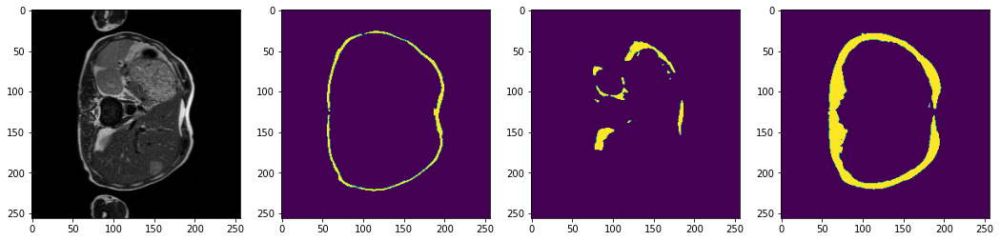

2024-03-28 08:16:04,075 INFO image_writer.py:194 - writing: outMR09fold0/A003_v2_T2W_seg.nii.gz


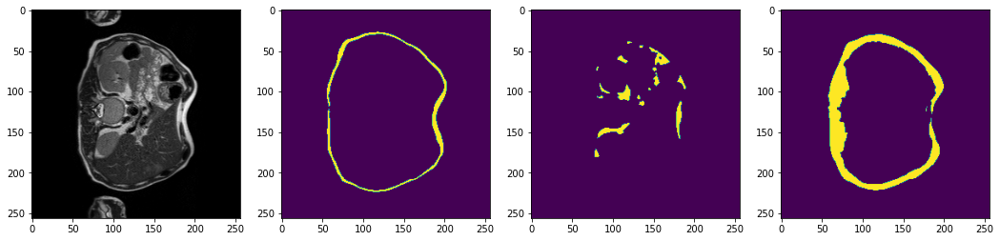

2024-03-28 08:16:06,347 INFO image_writer.py:194 - writing: outMR09fold0/A009_v1_T2W_seg.nii.gz


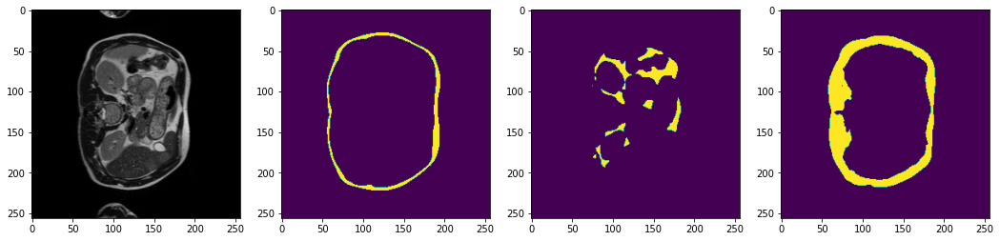

2024-03-28 08:16:08,648 INFO image_writer.py:194 - writing: outMR09fold0/A009_v2_T2W_seg.nii.gz


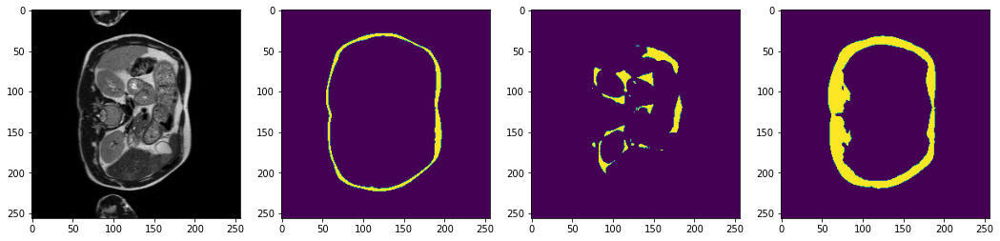

2024-03-28 08:16:10,976 INFO image_writer.py:194 - writing: outMR09fold0/A011_v1_T2W_seg.nii.gz


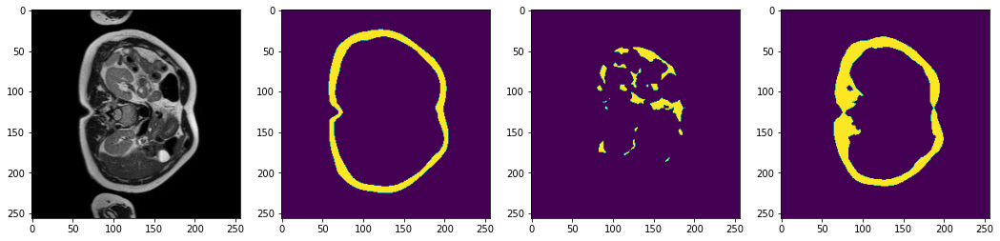

2024-03-28 08:16:13,279 INFO image_writer.py:194 - writing: outMR09fold0/A011_v2_T2W_seg.nii.gz


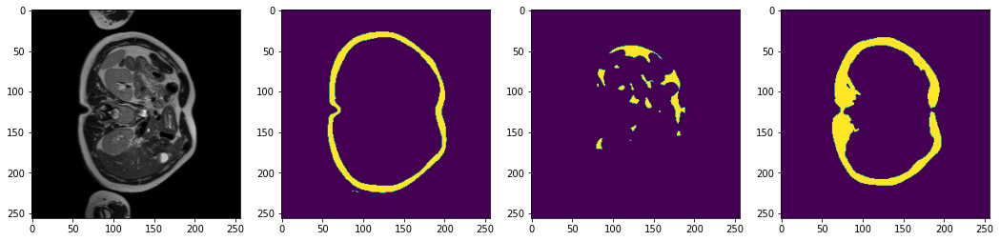

2024-03-28 08:16:15,755 INFO image_writer.py:194 - writing: outMR09fold0/A013_v1_T2W_seg.nii.gz


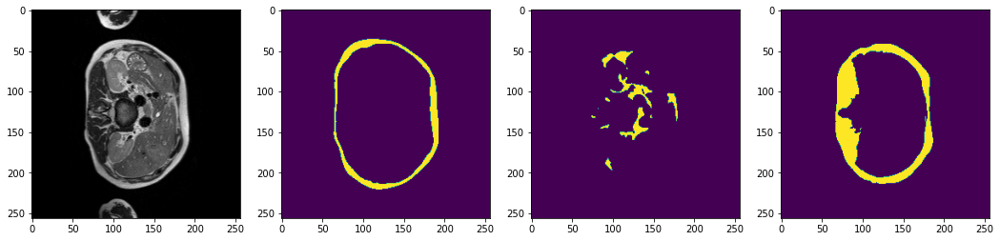

2024-03-28 08:16:17,974 INFO image_writer.py:194 - writing: outMR09fold0/A013_v2_T2W_seg.nii.gz


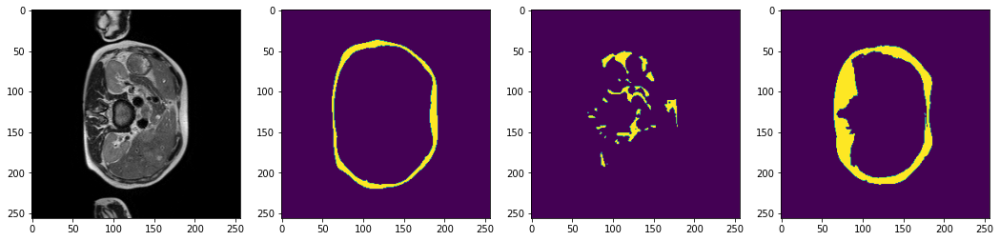

2024-03-28 08:16:20,310 INFO image_writer.py:194 - writing: outMR09fold0/A014_v1_T2W_seg.nii.gz


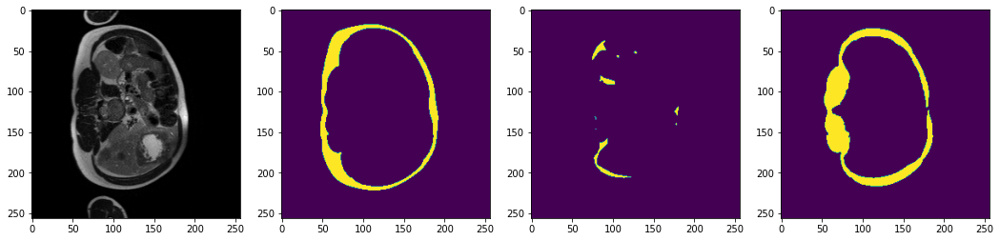

2024-03-28 08:16:22,690 INFO image_writer.py:194 - writing: outMR09fold0/A014_v2_T2W_seg.nii.gz


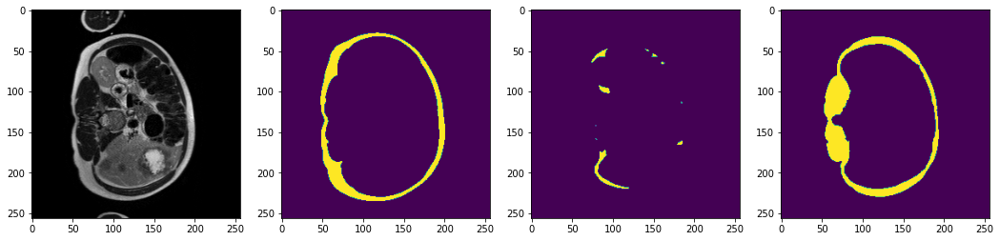

2024-03-28 08:16:25,032 INFO image_writer.py:194 - writing: outMR09fold0/A015_v1_T2W_seg.nii.gz


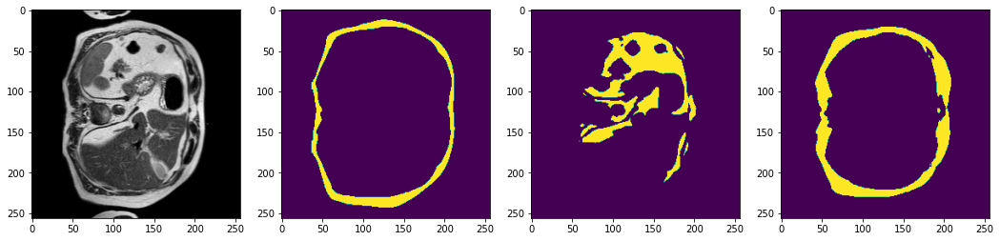

2024-03-28 08:16:27,364 INFO image_writer.py:194 - writing: outMR09fold0/A015_v2_T2W_seg.nii.gz


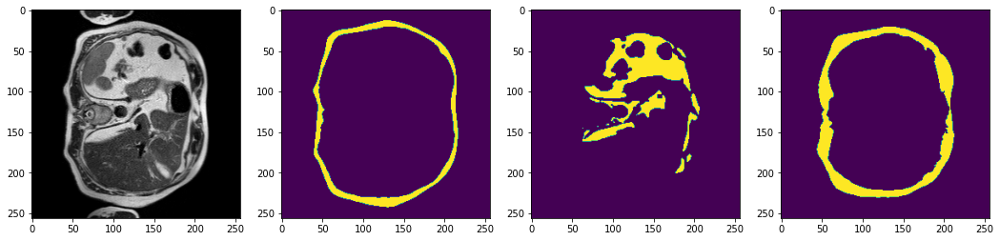

Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


2024-03-28 08:16:29,682 INFO image_writer.py:194 - writing: outMR09fold0/A016_v1_T2W_seg.nii.gz


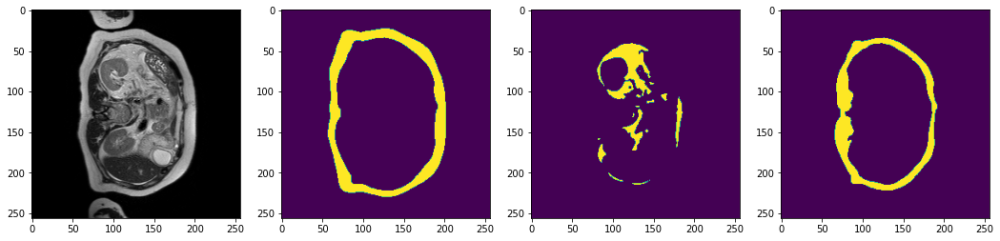

Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


2024-03-28 08:16:32,239 INFO image_writer.py:194 - writing: outMR09fold0/A016_v2_T2W_seg.nii.gz


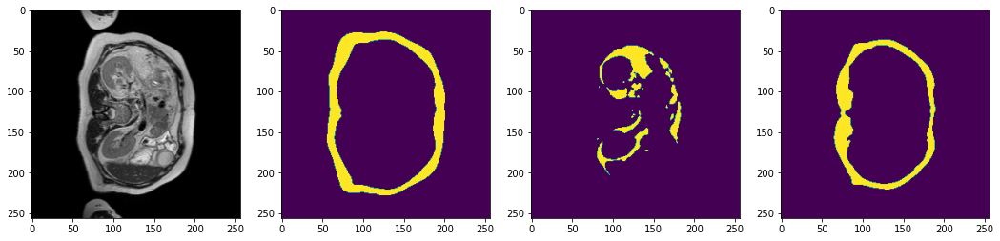

Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


2024-03-28 08:16:34,584 INFO image_writer.py:194 - writing: outMR09fold0/A017_v1_T2W_seg.nii.gz


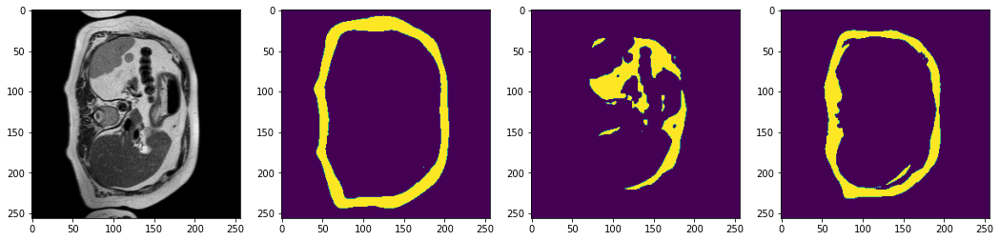

Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


2024-03-28 08:16:36,924 INFO image_writer.py:194 - writing: outMR09fold0/A017_v2_T2W_seg.nii.gz


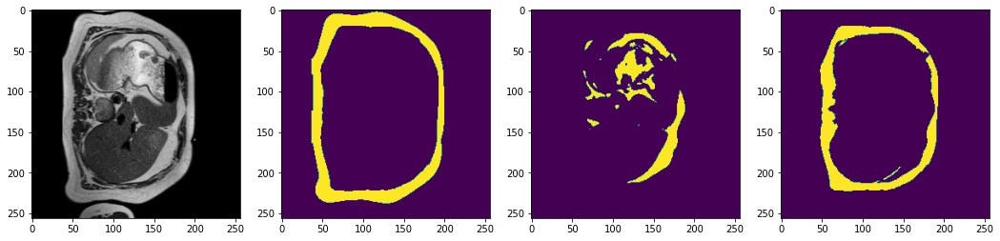

2024-03-28 08:16:39,260 INFO image_writer.py:194 - writing: outMR09fold0/A018_v1_T2W_seg.nii.gz


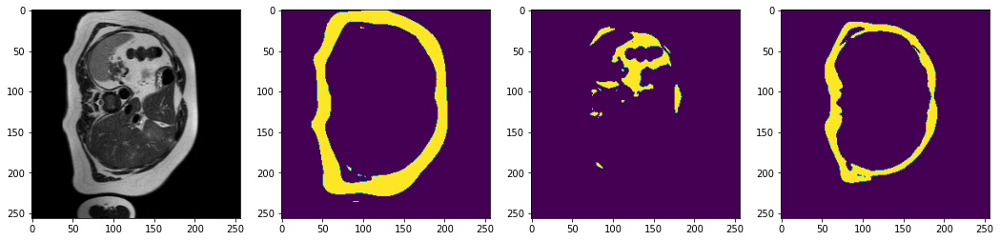

2024-03-28 08:16:41,583 INFO image_writer.py:194 - writing: outMR09fold0/A018_v2_T2W_seg.nii.gz


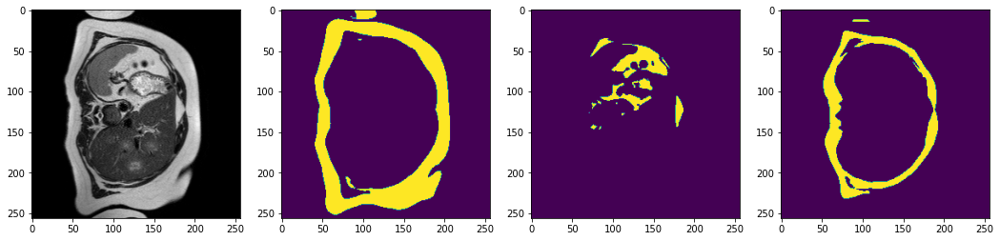

2024-03-28 08:16:43,952 INFO image_writer.py:194 - writing: outMR09fold0/A021_v1_T2W_seg.nii.gz


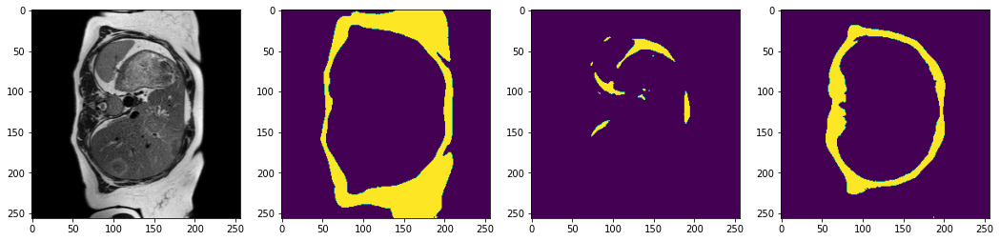

2024-03-28 08:16:46,323 INFO image_writer.py:194 - writing: outMR09fold0/A021_v2_T2W_seg.nii.gz


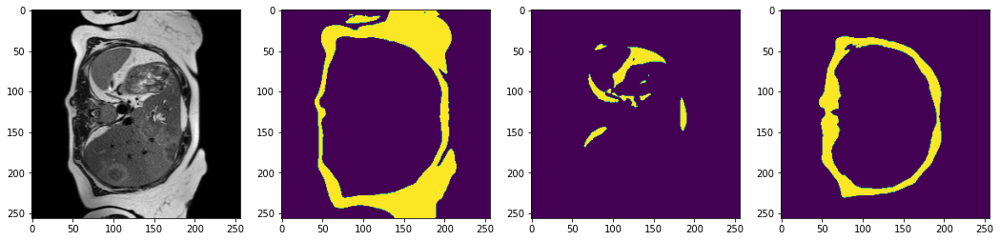

2024-03-28 08:16:52,147 INFO image_writer.py:194 - writing: outMR09fold0/A022_v1_T2W_seg.nii.gz


Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


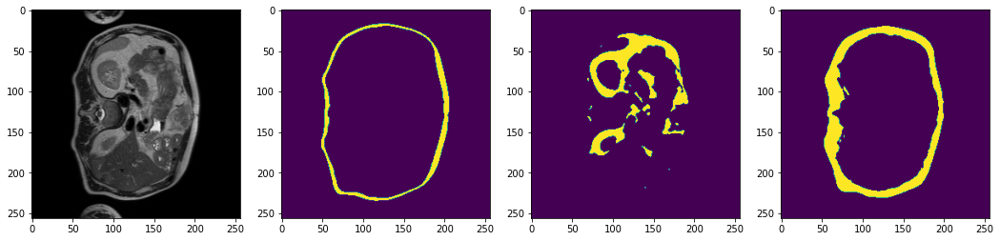

2024-03-28 08:16:57,715 INFO image_writer.py:194 - writing: outMR09fold0/A022_v2_T2W_seg.nii.gz


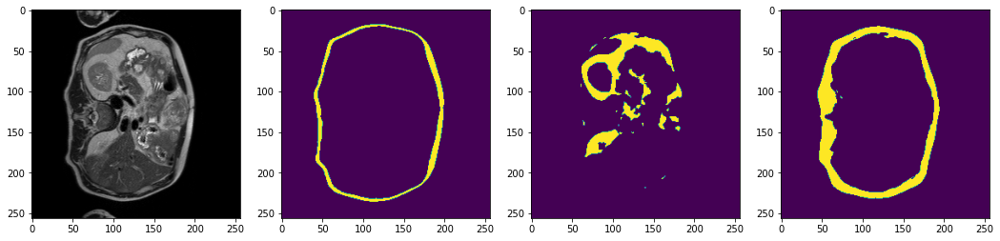

2024-03-28 08:17:03,326 INFO image_writer.py:194 - writing: outMR09fold0/A023_v1_T2W_seg.nii.gz


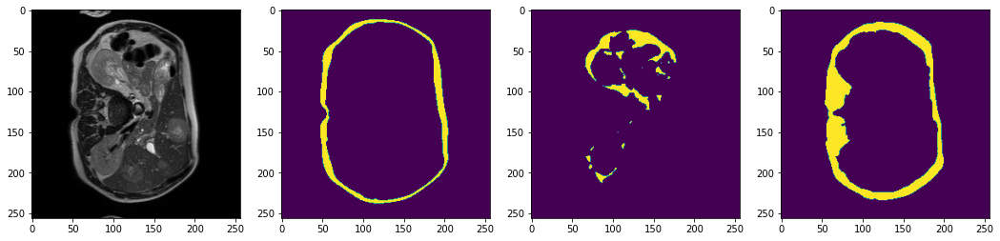

2024-03-28 08:17:08,920 INFO image_writer.py:194 - writing: outMR09fold0/A023_v2_T2W_seg.nii.gz


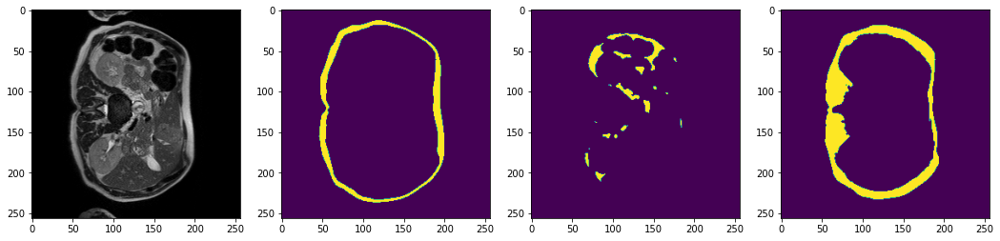

2024-03-28 08:17:11,265 INFO image_writer.py:194 - writing: outMR09fold0/A024_v1_T2W_seg.nii.gz


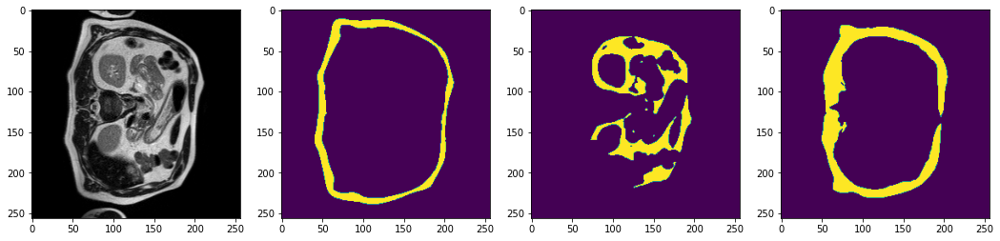

2024-03-28 08:17:13,598 INFO image_writer.py:194 - writing: outMR09fold0/A024_v2_T2W_seg.nii.gz


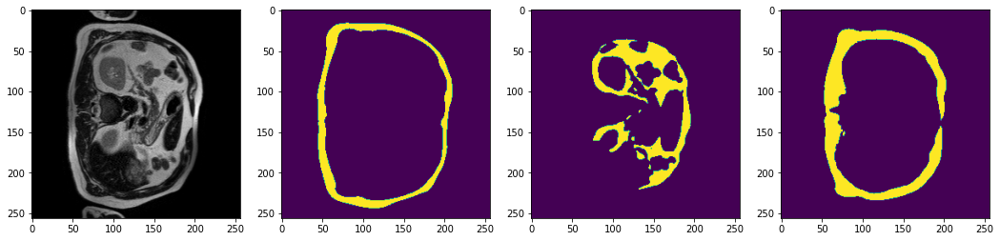

2024-03-28 08:17:19,301 INFO image_writer.py:194 - writing: outMR09fold0/A026_v1_T2W_seg.nii.gz


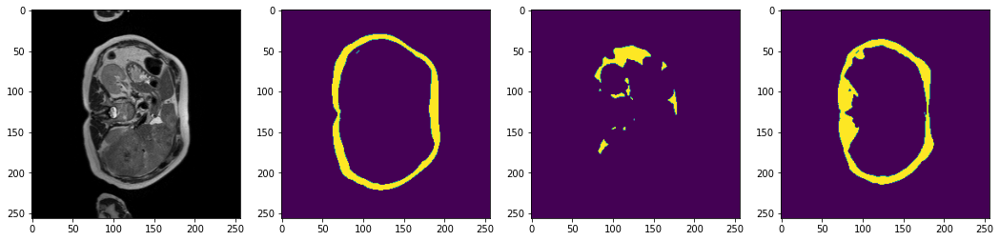

2024-03-28 08:17:25,123 INFO image_writer.py:194 - writing: outMR09fold0/A026_v2_T2W_seg.nii.gz


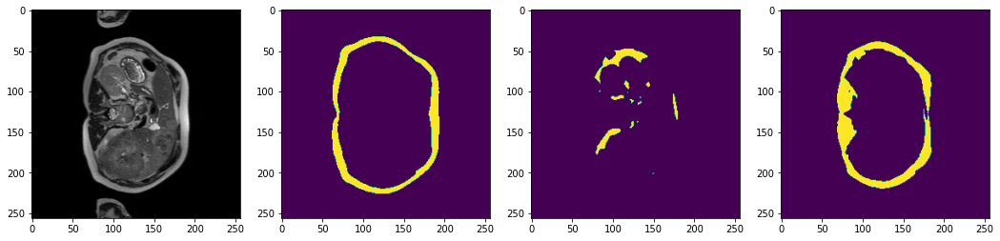

2024-03-28 08:17:27,484 INFO image_writer.py:194 - writing: outMR09fold0/A028_v1_T2W_seg.nii.gz


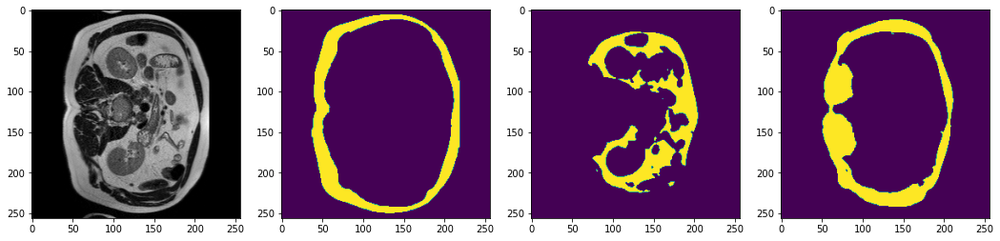

2024-03-28 08:17:29,834 INFO image_writer.py:194 - writing: outMR09fold0/A028_v2_T2W_seg.nii.gz


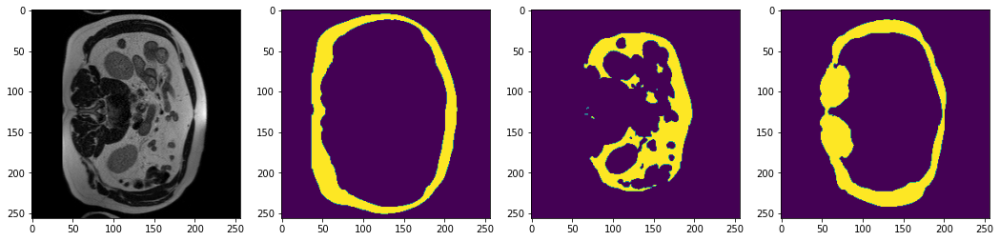

2024-03-28 08:17:32,225 INFO image_writer.py:194 - writing: outMR09fold0/A029_v1_T2W_seg.nii.gz


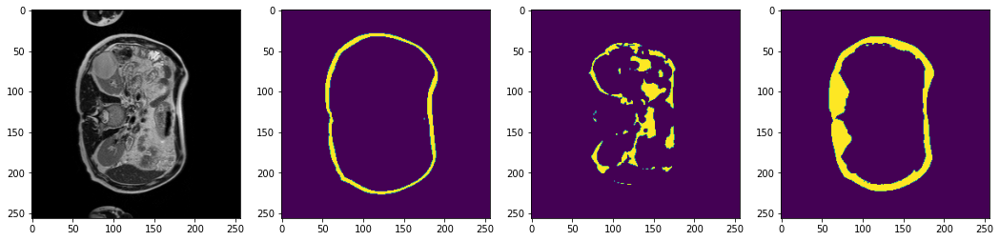

2024-03-28 08:17:34,324 INFO image_writer.py:194 - writing: outMR09fold0/A029_v2_T2W_seg.nii.gz


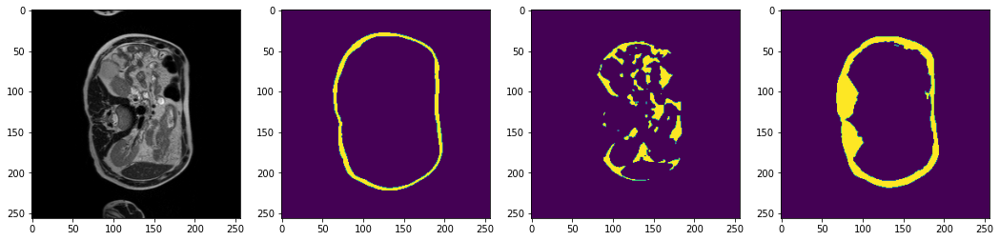

2024-03-28 08:17:36,717 INFO image_writer.py:194 - writing: outMR09fold0/A029_v3_T2W_seg.nii.gz


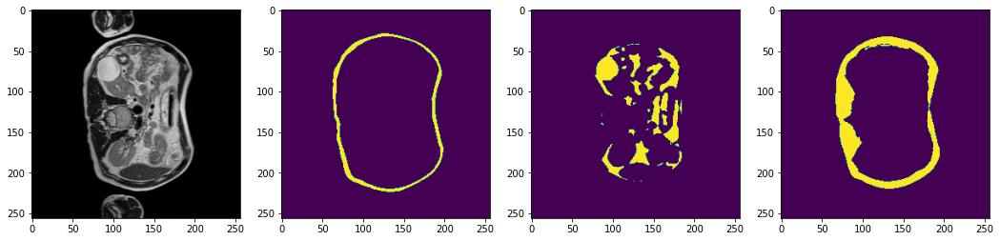

2024-03-28 08:17:38,835 INFO image_writer.py:194 - writing: outMR09fold0/A029_v4_T2W_seg.nii.gz


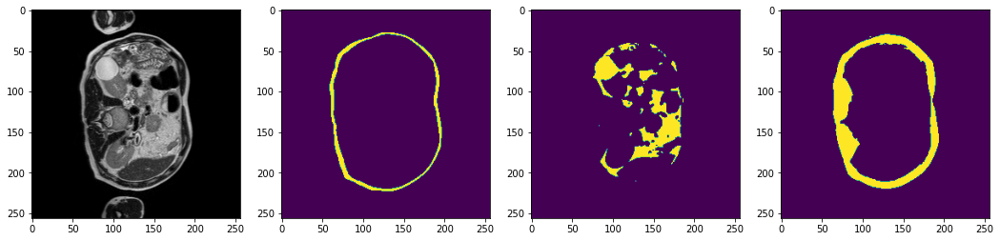

2024-03-28 08:17:41,183 INFO image_writer.py:194 - writing: outMR09fold0/A030_v1_T2W_seg.nii.gz


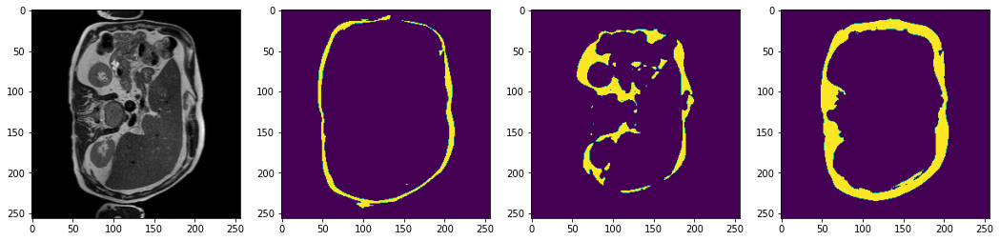

2024-03-28 08:17:43,687 INFO image_writer.py:194 - writing: outMR09fold0/A030_v2_T2W_seg.nii.gz


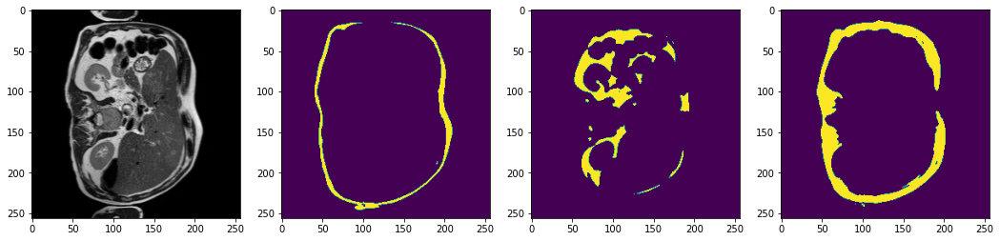

2024-03-28 08:17:45,760 INFO image_writer.py:194 - writing: outMR09fold0/A031_v1_T2W_seg.nii.gz


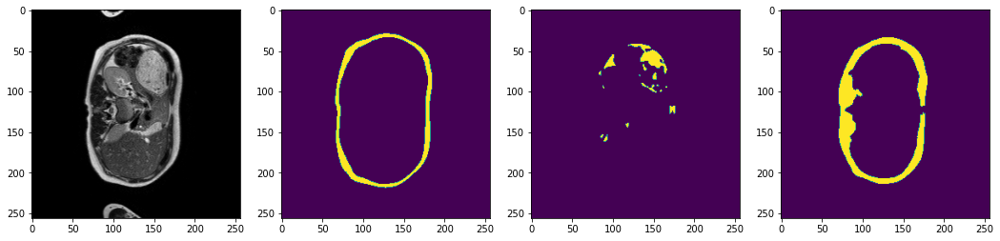

2024-03-28 08:17:47,845 INFO image_writer.py:194 - writing: outMR09fold0/A031_v2_T2W_seg.nii.gz


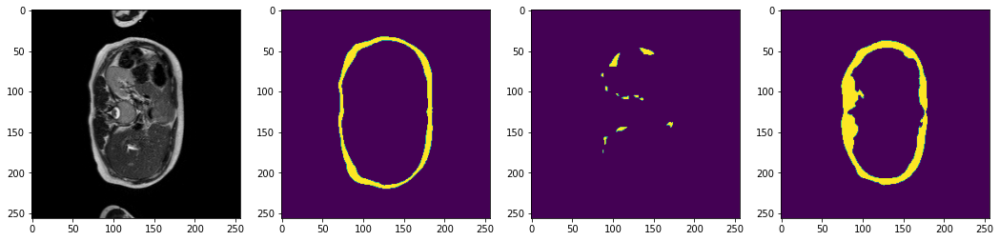

2024-03-28 08:17:53,517 INFO image_writer.py:194 - writing: outMR09fold0/A032_v1_T2W_seg.nii.gz


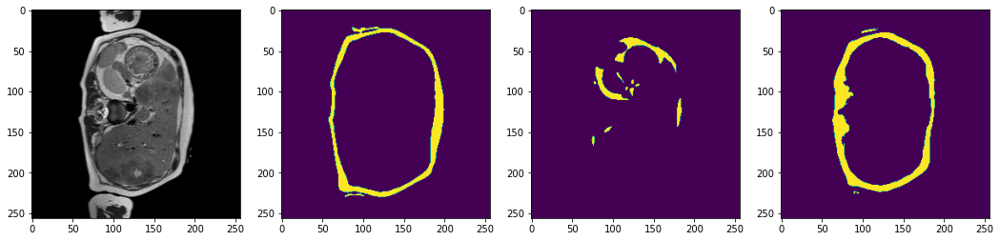

2024-03-28 08:17:59,230 INFO image_writer.py:194 - writing: outMR09fold0/A032_v2_T2W_seg.nii.gz


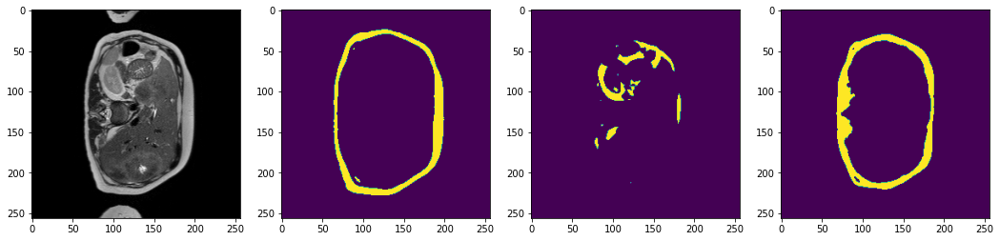

2024-03-28 08:18:04,921 INFO image_writer.py:194 - writing: outMR09fold0/A033_v1_T2W_seg.nii.gz


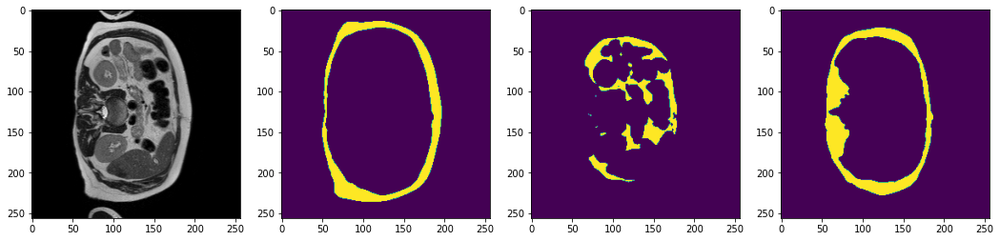

2024-03-28 08:18:10,579 INFO image_writer.py:194 - writing: outMR09fold0/A033_v2_T2W_seg.nii.gz


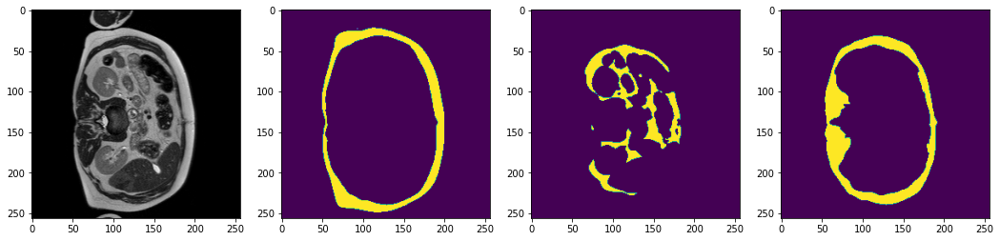

2024-03-28 08:18:16,340 INFO image_writer.py:194 - writing: outMR09fold0/A033_v3_T2W_seg.nii.gz


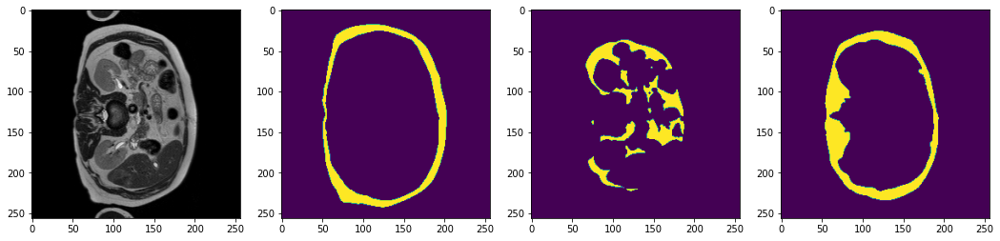

2024-03-28 08:18:21,995 INFO image_writer.py:194 - writing: outMR09fold0/A033_v4_T2W_seg.nii.gz


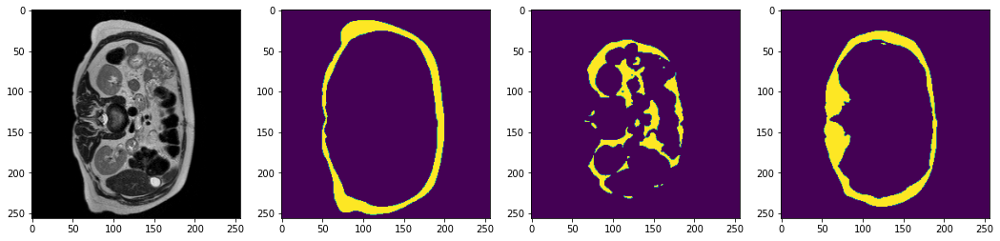

2024-03-28 08:18:27,647 INFO image_writer.py:194 - writing: outMR09fold0/A034_v1_T2W_seg.nii.gz


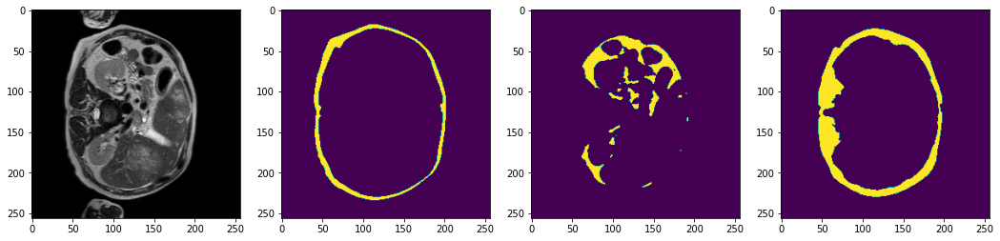

2024-03-28 08:18:33,299 INFO image_writer.py:194 - writing: outMR09fold0/A034_v2_T2W_seg.nii.gz


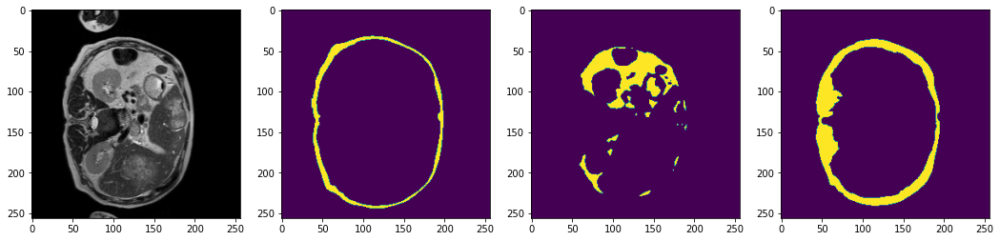

2024-03-28 08:18:38,973 INFO image_writer.py:194 - writing: outMR09fold0/A036_v1_T2W_seg.nii.gz


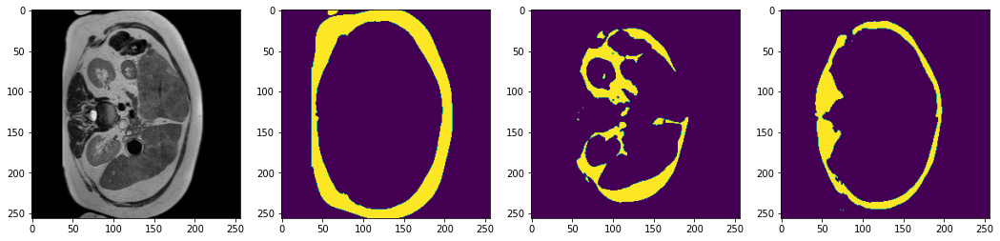

2024-03-28 08:18:44,627 INFO image_writer.py:194 - writing: outMR09fold0/A036_v2_T2W_seg.nii.gz


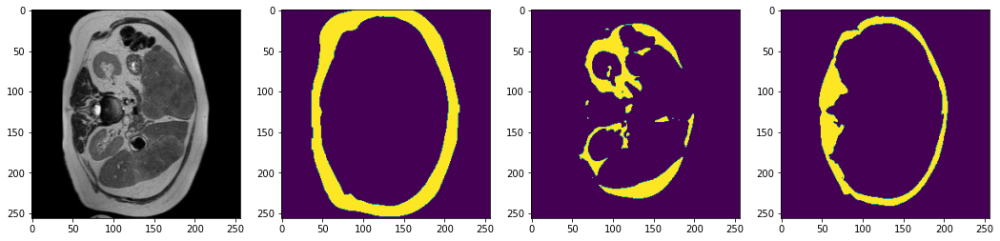

2024-03-28 08:18:49,637 INFO image_writer.py:194 - writing: outMR09fold0/A037_v1_T2W_seg.nii.gz


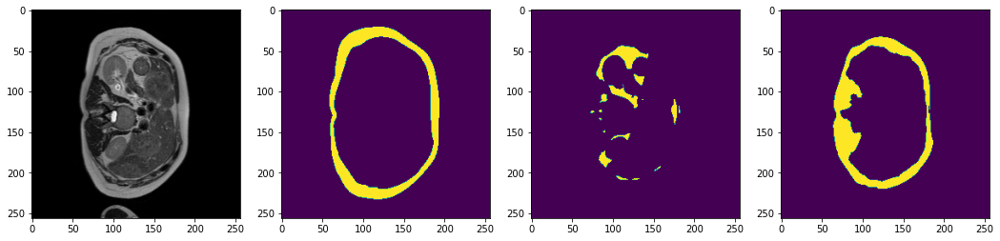

2024-03-28 08:18:55,760 INFO image_writer.py:194 - writing: outMR09fold0/A037_v2_T2W_seg.nii.gz


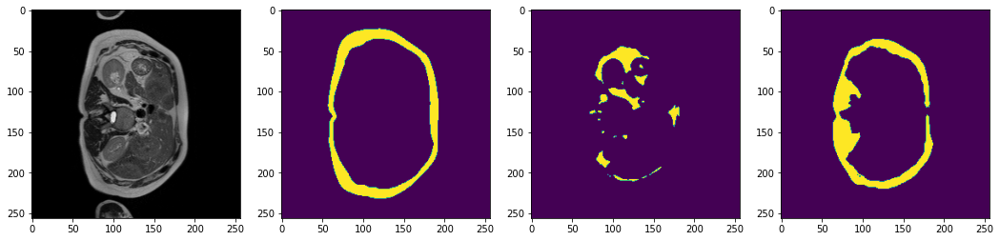

2024-03-28 08:18:58,267 INFO image_writer.py:194 - writing: outMR09fold0/A038_v1_T2W_seg.nii.gz


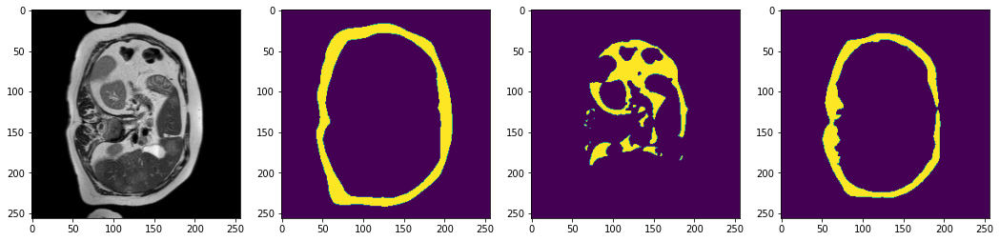

2024-03-28 08:19:00,745 INFO image_writer.py:194 - writing: outMR09fold0/A038_v2_T2W_seg.nii.gz


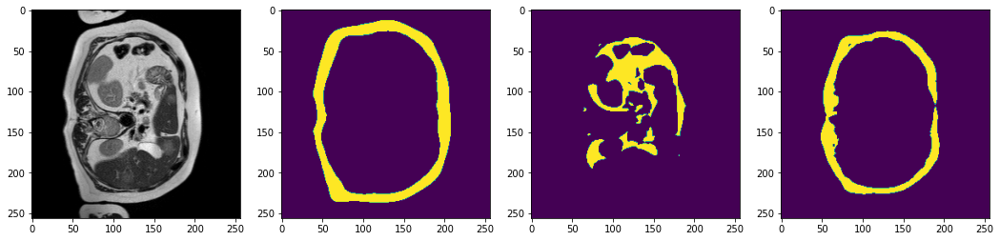

2024-03-28 08:19:02,848 INFO image_writer.py:194 - writing: outMR09fold0/A039_v1_T2W_seg.nii.gz


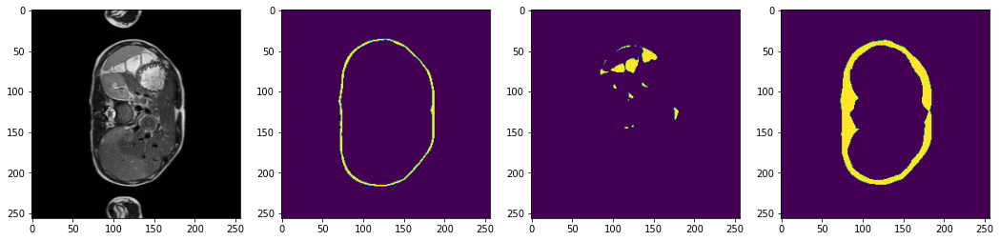

2024-03-28 08:19:04,689 INFO image_writer.py:194 - writing: outMR09fold0/A039_v2_T2W_seg.nii.gz


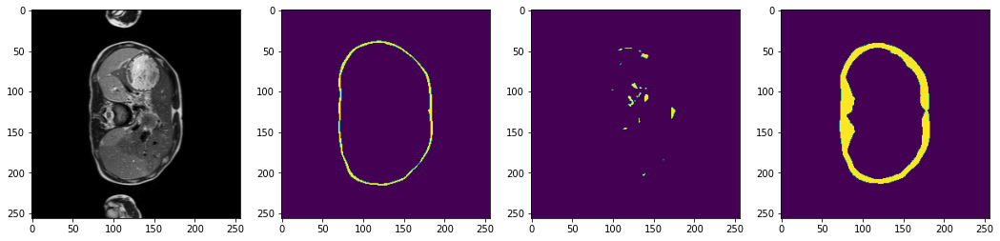

2024-03-28 08:19:10,385 INFO image_writer.py:194 - writing: outMR09fold0/A040_v1_T2W_seg.nii.gz


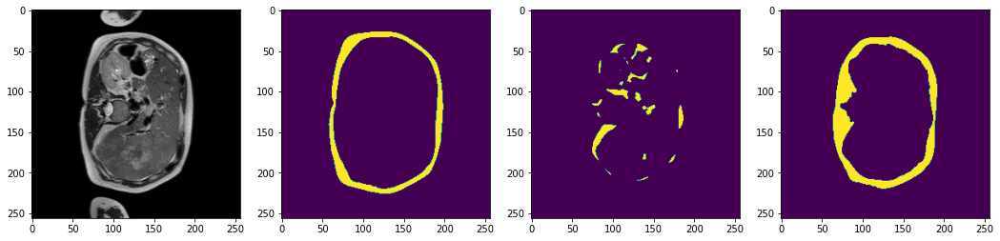

2024-03-28 08:19:16,030 INFO image_writer.py:194 - writing: outMR09fold0/A040_v2_T2W_seg.nii.gz


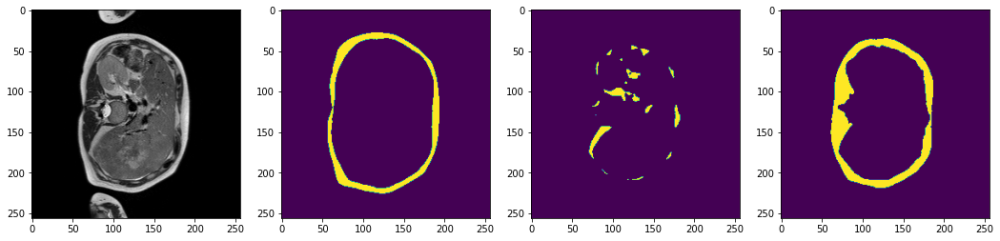

2024-03-28 08:19:18,382 INFO image_writer.py:194 - writing: outMR09fold0/A041_v1_T2W_seg.nii.gz


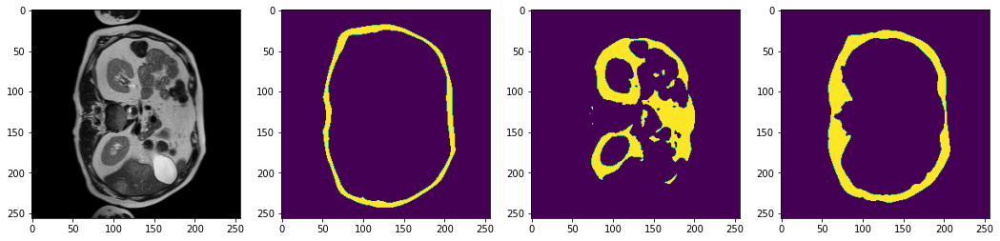

2024-03-28 08:19:20,923 INFO image_writer.py:194 - writing: outMR09fold0/A041_v2_T2W_seg.nii.gz


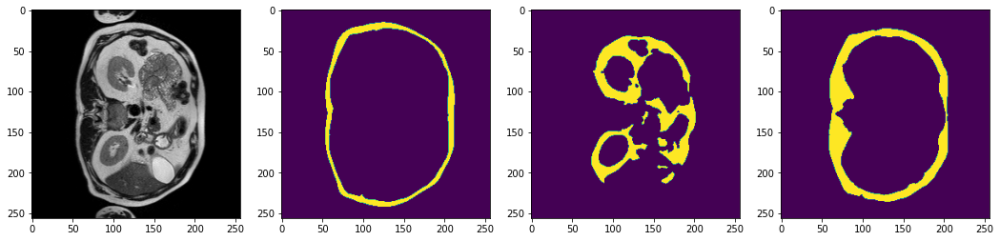

2024-03-28 08:19:26,648 INFO image_writer.py:194 - writing: outMR09fold0/A043_v1_T2W_seg.nii.gz


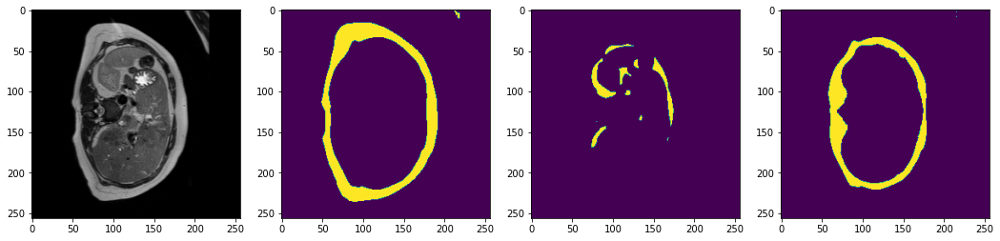

2024-03-28 08:19:32,355 INFO image_writer.py:194 - writing: outMR09fold0/A043_v2_T2W_seg.nii.gz


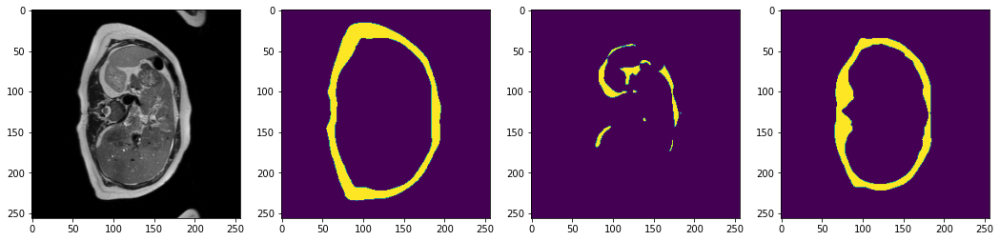

2024-03-28 08:19:37,968 INFO image_writer.py:194 - writing: outMR09fold0/A043_v5_T2W_seg.nii.gz


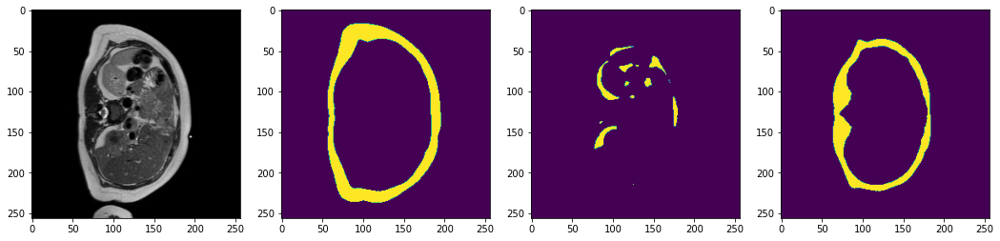

2024-03-28 08:19:40,328 INFO image_writer.py:194 - writing: outMR09fold0/A046_v1_T2W_seg.nii.gz


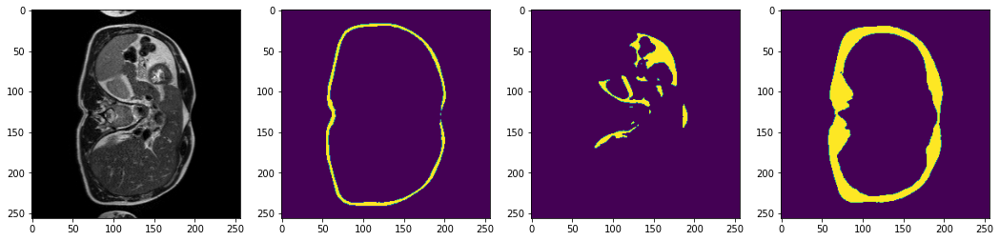

2024-03-28 08:19:42,676 INFO image_writer.py:194 - writing: outMR09fold0/A046_v2_T2W_seg.nii.gz


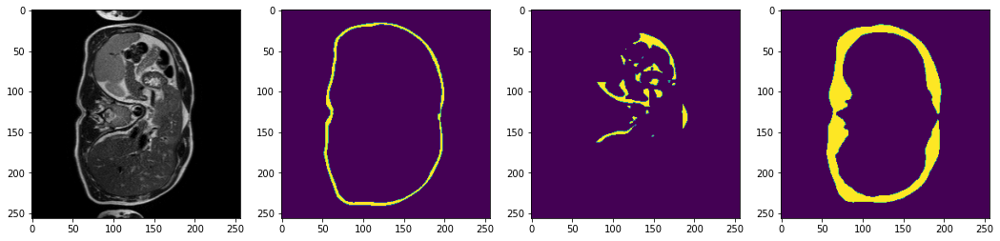

2024-03-28 08:19:45,040 INFO image_writer.py:194 - writing: outMR09fold0/A047_v1_T2W_seg.nii.gz


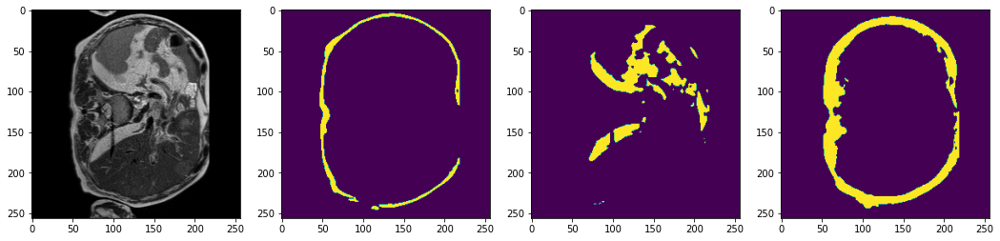

2024-03-28 08:19:47,566 INFO image_writer.py:194 - writing: outMR09fold0/A047_v2_T2W_seg.nii.gz


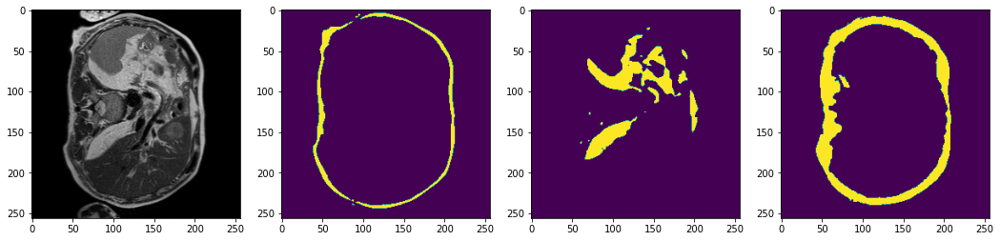

2024-03-28 08:19:49,960 INFO image_writer.py:194 - writing: outMR09fold0/A048_v1_T2W_seg.nii.gz


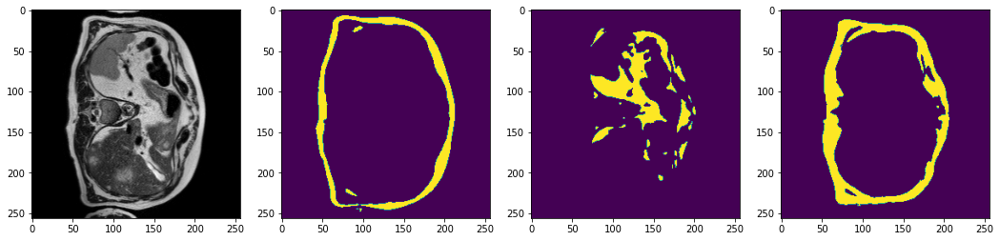

2024-03-28 08:19:52,338 INFO image_writer.py:194 - writing: outMR09fold0/A048_v2_T2W_seg.nii.gz


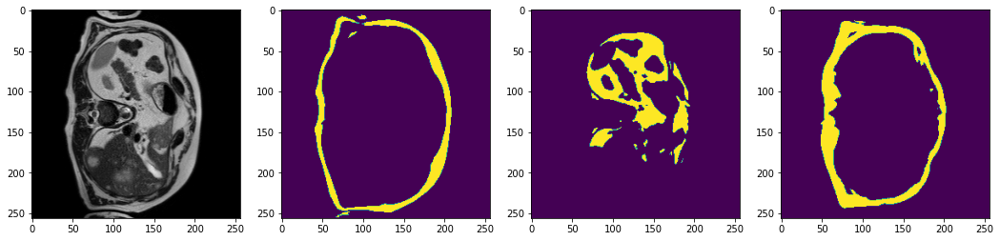

2024-03-28 08:19:54,666 INFO image_writer.py:194 - writing: outMR09fold0/A049_v1_T2W_seg.nii.gz


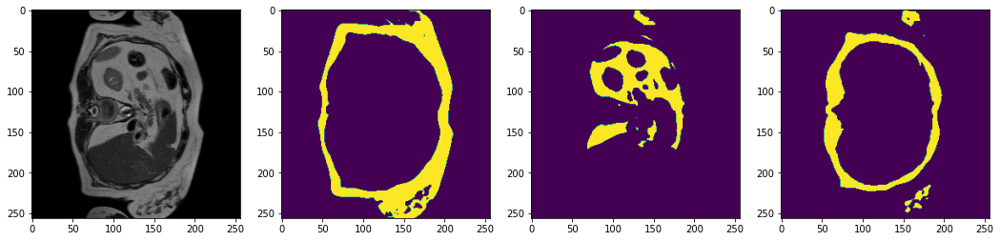

2024-03-28 08:19:57,038 INFO image_writer.py:194 - writing: outMR09fold0/A049_v2_T2W_seg.nii.gz


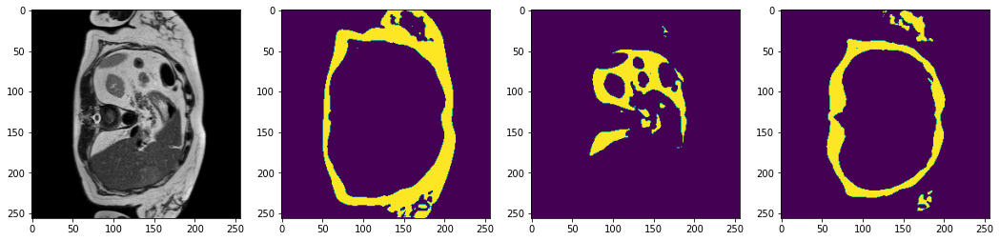

2024-03-28 08:19:59,404 INFO image_writer.py:194 - writing: outMR09fold0/A050_v1_T2W_seg.nii.gz


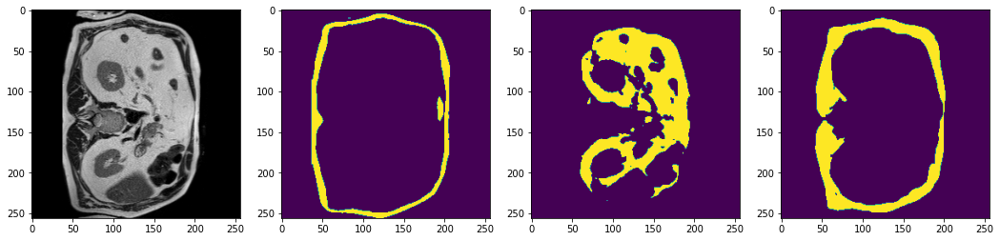

2024-03-28 08:20:01,799 INFO image_writer.py:194 - writing: outMR09fold0/A050_v2_T2W_seg.nii.gz


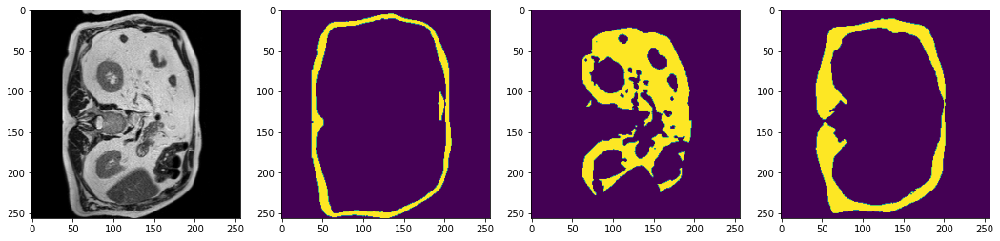

2024-03-28 08:20:04,296 INFO image_writer.py:194 - writing: outMR09fold0/A051_v1_T2W_seg.nii.gz


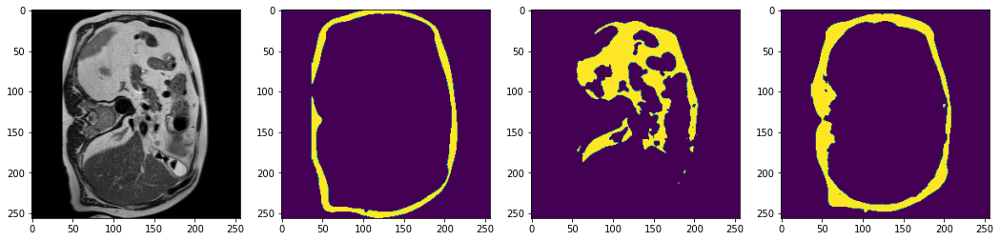

2024-03-28 08:20:06,626 INFO image_writer.py:194 - writing: outMR09fold0/A051_v2_T2W_seg.nii.gz


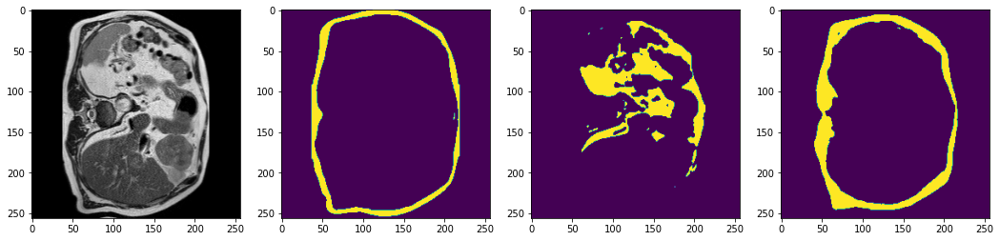

2024-03-28 08:20:12,316 INFO image_writer.py:194 - writing: outMR09fold0/A052_v1_T2W_seg.nii.gz


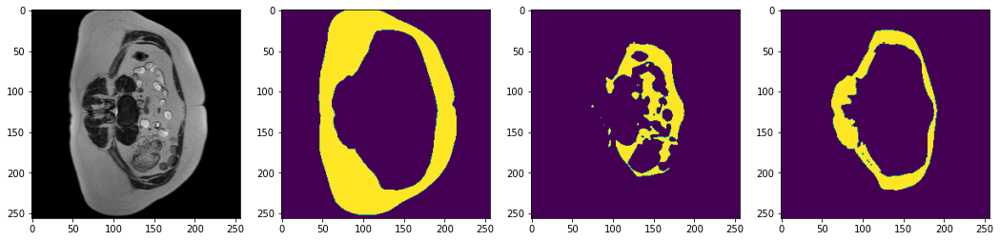

2024-03-28 08:20:17,936 INFO image_writer.py:194 - writing: outMR09fold0/A052_v2_T2W_seg.nii.gz


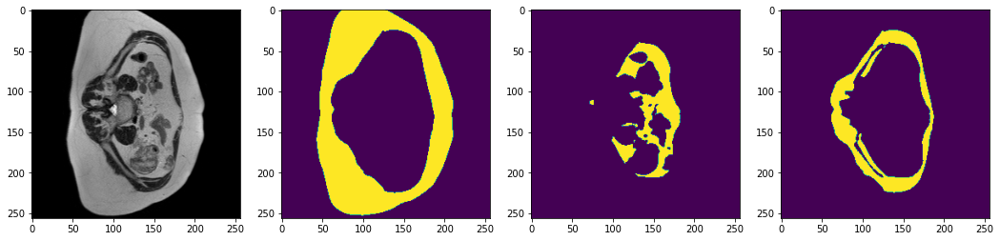

2024-03-28 08:20:20,293 INFO image_writer.py:194 - writing: outMR09fold0/A055_v1_T2W_seg.nii.gz


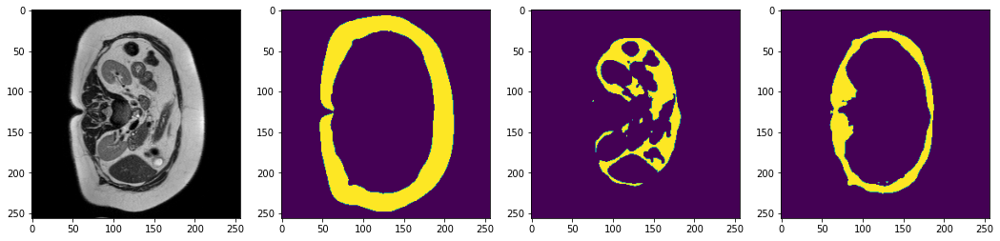

2024-03-28 08:20:22,640 INFO image_writer.py:194 - writing: outMR09fold0/A055_v2_T2W_seg.nii.gz


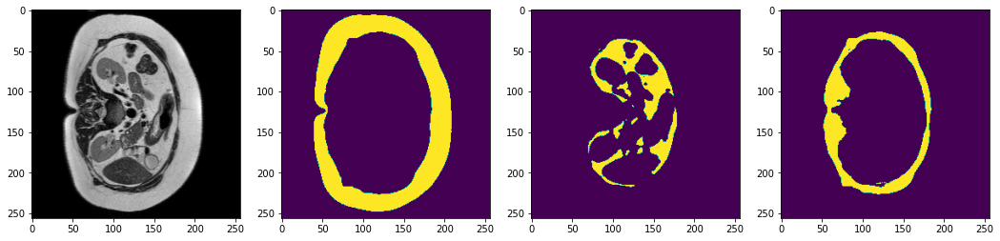

2024-03-28 08:20:25,011 INFO image_writer.py:194 - writing: outMR09fold0/A056_v1_T2W_seg.nii.gz


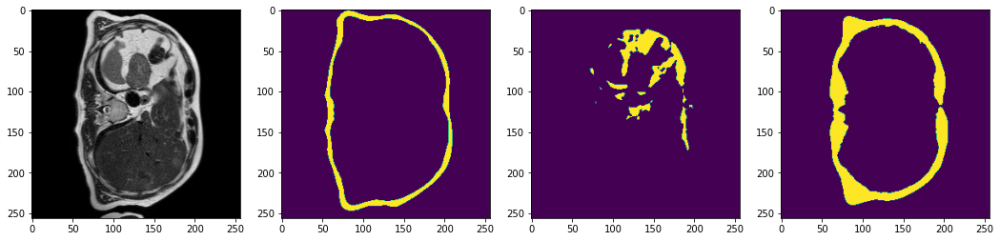

2024-03-28 08:20:27,532 INFO image_writer.py:194 - writing: outMR09fold0/A056_v2_T2W_seg.nii.gz


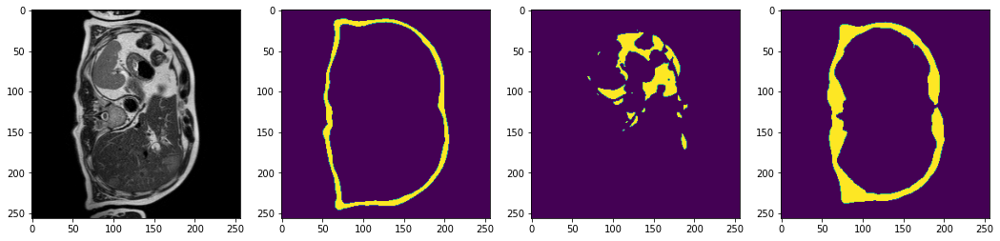

2024-03-28 08:20:29,936 INFO image_writer.py:194 - writing: outMR09fold0/A057_v1_T2W_seg.nii.gz


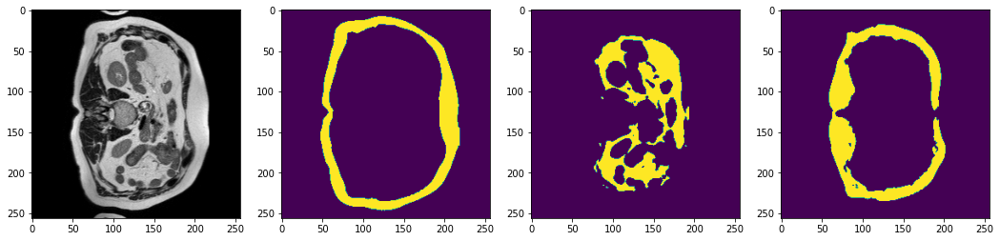

2024-03-28 08:20:32,348 INFO image_writer.py:194 - writing: outMR09fold0/A057_v2_T2W_seg.nii.gz


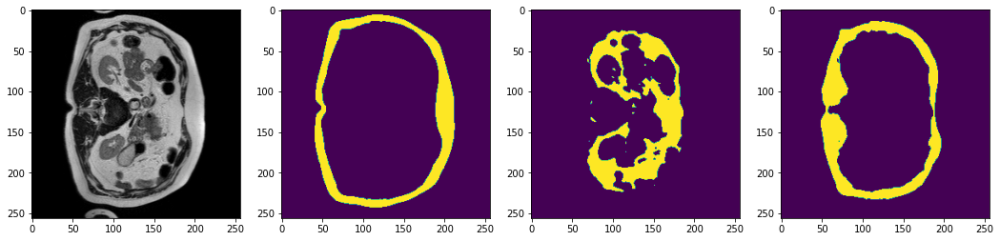

2024-03-28 08:20:38,039 INFO image_writer.py:194 - writing: outMR09fold0/A061_v1_T2W_seg.nii.gz


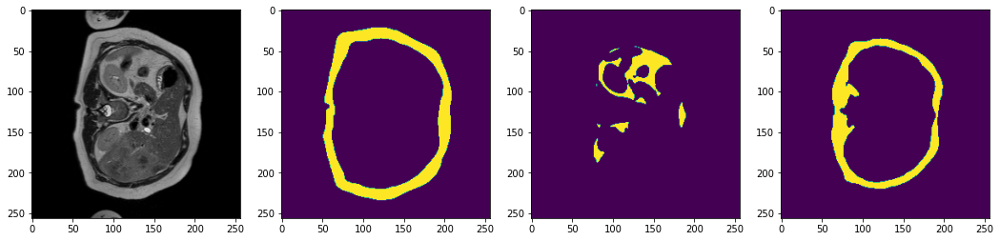

2024-03-28 08:20:43,647 INFO image_writer.py:194 - writing: outMR09fold0/A061_v2_T2W_seg.nii.gz


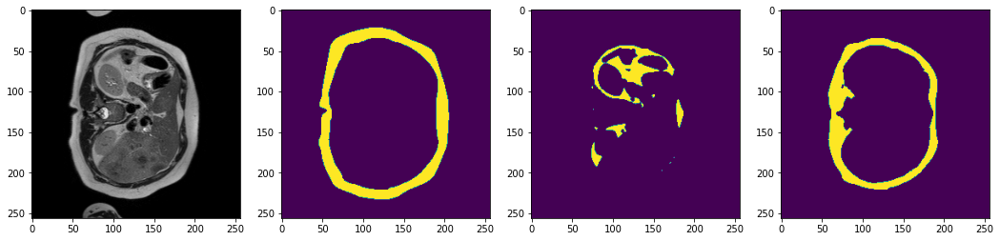

2024-03-28 08:20:45,788 INFO image_writer.py:194 - writing: outMR09fold0/A062_v1_T2W_seg.nii.gz


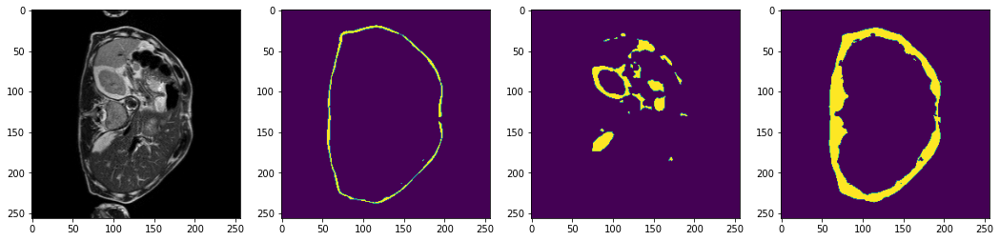

2024-03-28 08:20:47,902 INFO image_writer.py:194 - writing: outMR09fold0/A062_v2_T2W_seg.nii.gz


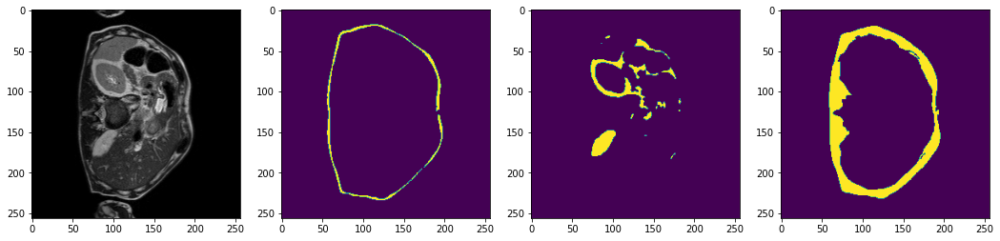

2024-03-28 08:20:50,478 INFO image_writer.py:194 - writing: outMR09fold0/A063_v1_T2W_seg.nii.gz


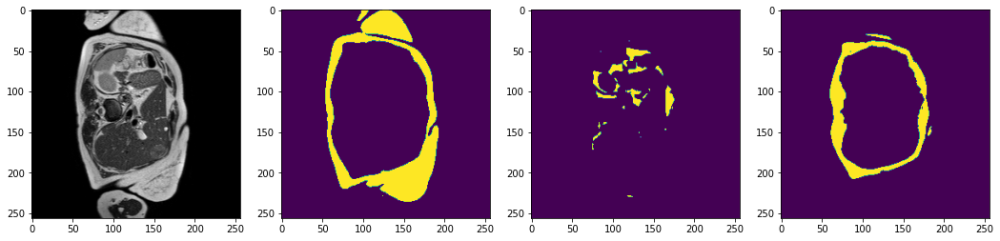

2024-03-28 08:20:52,864 INFO image_writer.py:194 - writing: outMR09fold0/A063_v2_T2W_seg.nii.gz


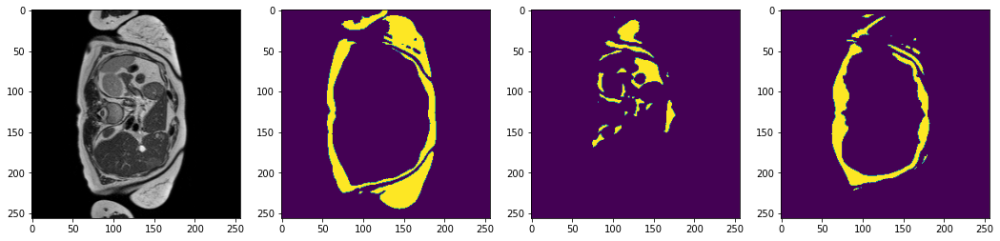

2024-03-28 08:20:55,239 INFO image_writer.py:194 - writing: outMR09fold0/A064_v1_T2W_seg.nii.gz


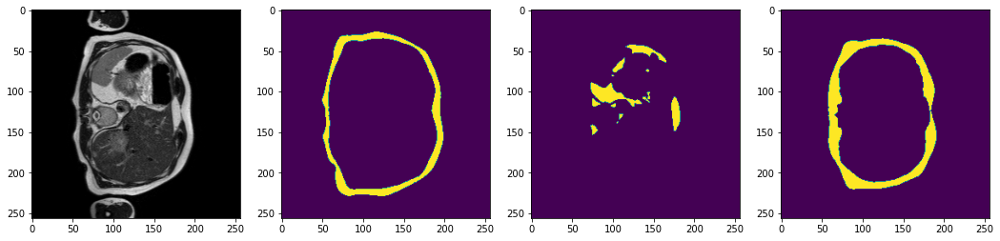

2024-03-28 08:20:57,596 INFO image_writer.py:194 - writing: outMR09fold0/A064_v2_T2W_seg.nii.gz


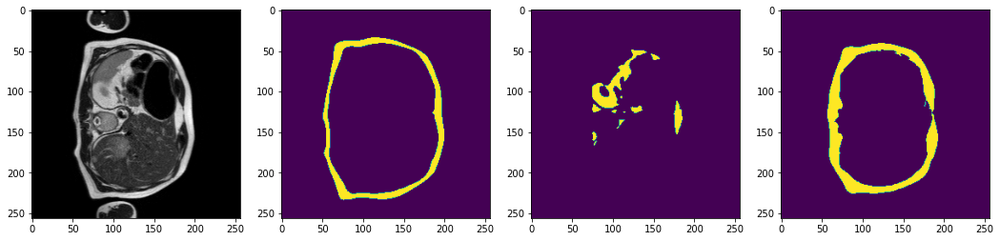

2024-03-28 08:20:59,953 INFO image_writer.py:194 - writing: outMR09fold0/A066_v1_T2W_seg.nii.gz


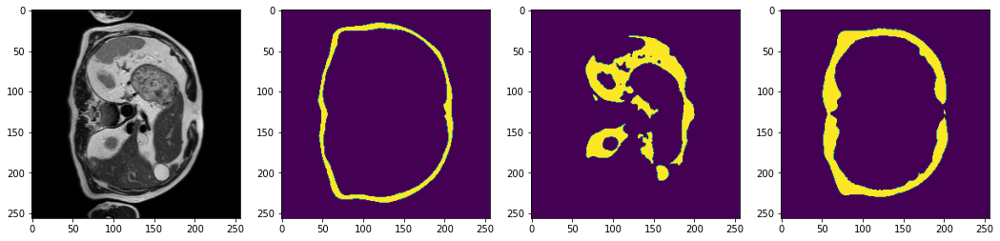

2024-03-28 08:21:02,318 INFO image_writer.py:194 - writing: outMR09fold0/A066_v2_T2W_seg.nii.gz


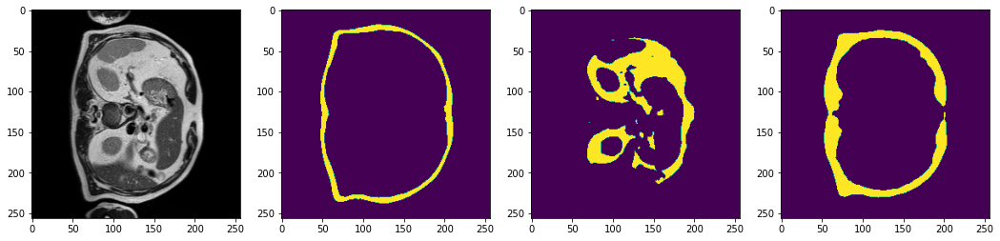

2024-03-28 08:21:04,721 INFO image_writer.py:194 - writing: outMR09fold0/A067_v1_T2W_seg.nii.gz


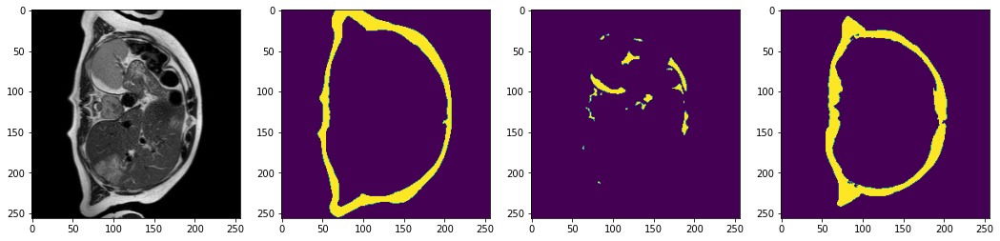

2024-03-28 08:21:07,231 INFO image_writer.py:194 - writing: outMR09fold0/A067_v2_T2W_seg.nii.gz


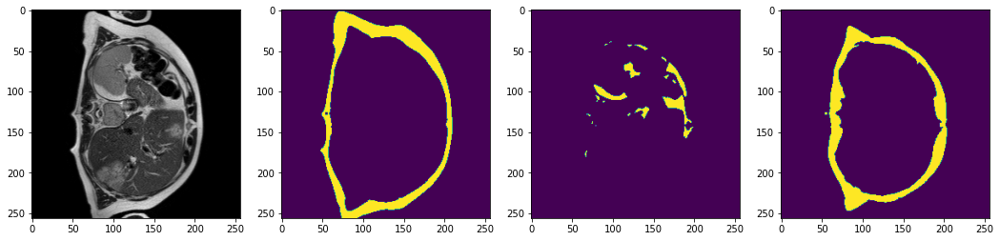

2024-03-28 08:21:09,184 INFO image_writer.py:194 - writing: outMR09fold0/A068_v1_T2W_seg.nii.gz


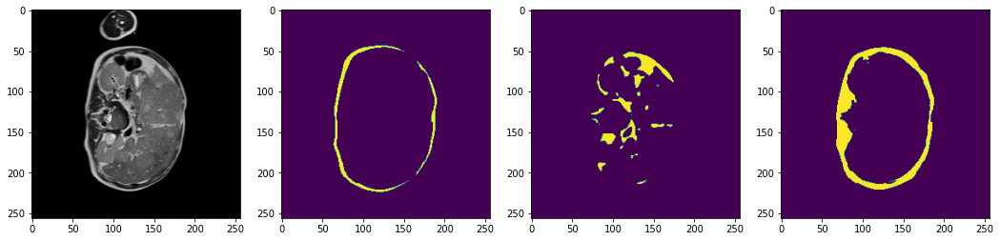

2024-03-28 08:21:11,262 INFO image_writer.py:194 - writing: outMR09fold0/A068_v2_T2W_seg.nii.gz


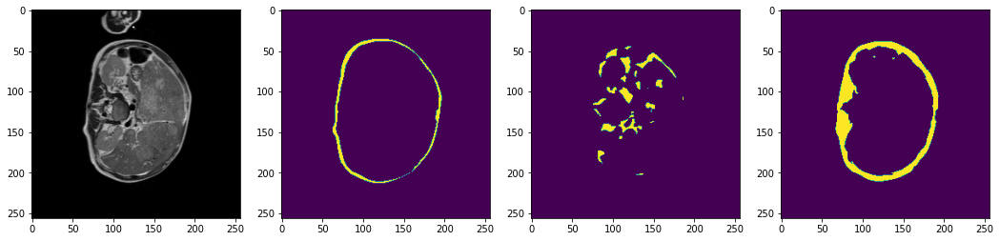

2024-03-28 08:21:16,098 INFO image_writer.py:194 - writing: outMR09fold0/A071_v1_T2W_seg.nii.gz


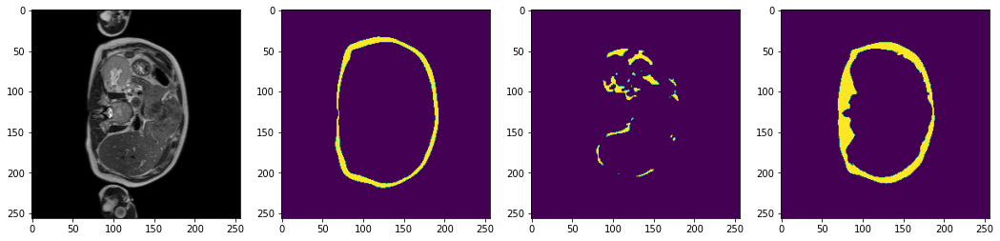

2024-03-28 08:21:20,928 INFO image_writer.py:194 - writing: outMR09fold0/A071_v2_T2W_seg.nii.gz


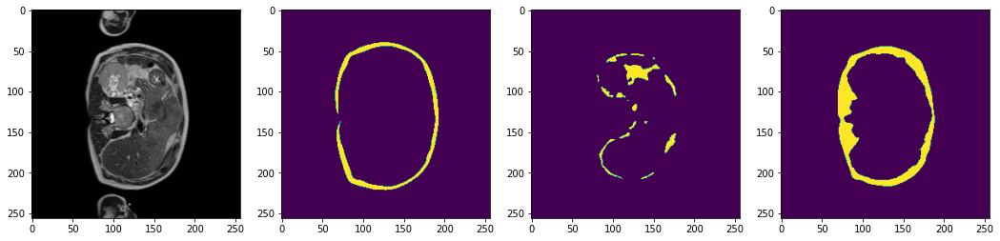

2024-03-28 08:21:25,785 INFO image_writer.py:194 - writing: outMR09fold0/A074_v1_T2W_seg.nii.gz


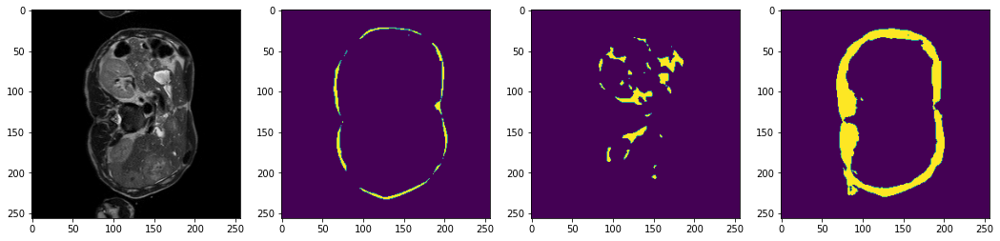

2024-03-28 08:21:31,466 INFO image_writer.py:194 - writing: outMR09fold0/A074_v2_T2W_seg.nii.gz


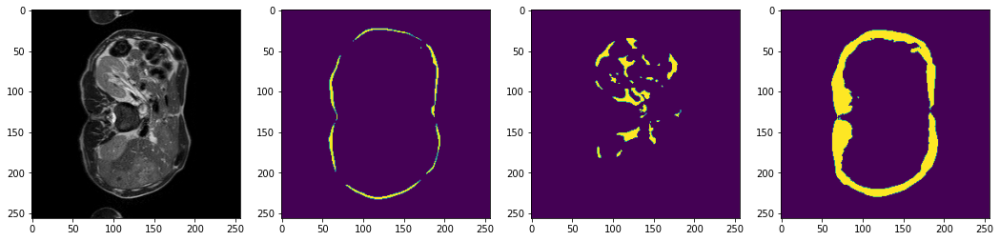

2024-03-28 08:21:33,743 INFO image_writer.py:194 - writing: outMR09fold0/A076_v1_T2W_seg.nii.gz


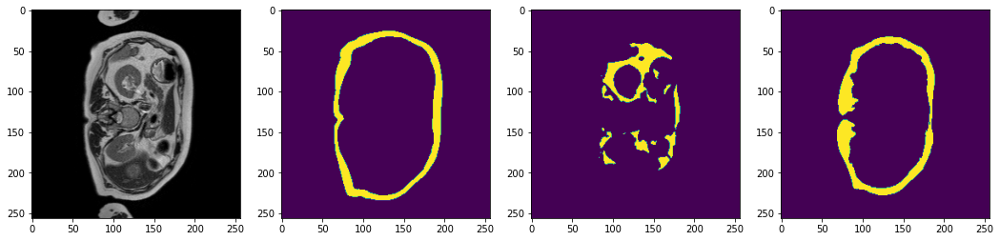

2024-03-28 08:21:36,076 INFO image_writer.py:194 - writing: outMR09fold0/A076_v2_T2W_seg.nii.gz


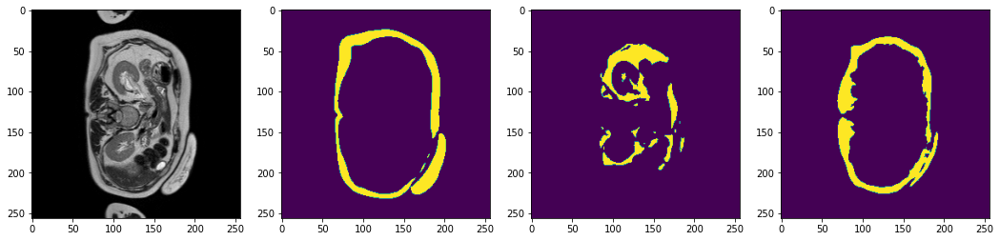

In [7]:
from monai.transforms import LoadImage
loader = LoadImage()

model.load_state_dict(torch.load(
    os.path.join(root_dir, "TestMR09_unetrensemble_fold0.pth")))
model.eval()

with torch.no_grad():
    for test_data in test_org_loader:
        test_inputs = test_data["image"].to(device)
        roi_size = (96, 96, 16)
        sw_batch_size = 4
        test_data["pred"] = sliding_window_inference(
            test_inputs, roi_size, sw_batch_size, model, overlap=0.8)

        test_data = [post_transforms(i) for i in decollate_batch(test_data)]

#         # uncomment the following lines to visualize the predicted results
        test_output = from_engine(["pred"])(test_data)

        original_image = loader(test_data[0]["image_meta_dict"]["filename_or_obj"])[0]

        plt.figure("check", (18, 6))
        plt.subplot(1, 4, 1)
        plt.imshow(original_image[:, :, 8], cmap="gray")
        plt.subplot(1, 4, 2)
        plt.imshow(test_output[0].detach().cpu()[2, :, :, 8])
        plt.subplot(1, 4, 3)
        plt.imshow(test_output[0].detach().cpu()[3, :, :, 8])
        plt.subplot(1, 4, 4)
        plt.imshow(test_output[0].detach().cpu()[5, :, :, 8])
        plt.show()

In [ ]:
!tar -cvzf outMR09fold0.tar.gz outMR09fold0